In [1]:
import os
from datetime import datetime
import logging
import sys
import json
import time
import statistics
import random
import math
import csv
import shutil
import cv2
import matplotlib.pyplot as plt
import numpy as np
from collections import deque
import seaborn as sns

from sklearn.metrics import confusion_matrix
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split

import boto3
from botocore import UNSIGNED
from botocore.config import Config

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
from torchvision import transforms
import torchvision.models as models

from torch.utils.data import Dataset, DataLoader, random_split
import kornia.augmentation as K
from torchview import draw_graph

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)


VIDEOS_DIR_PATH: str = './video-data'
CHECKPOINT_DIR='checkpoints'

VIDEO_EXTENSIONS = ('.mp4', '.avi', '.mov')
mps_device = torch.device("mps")
DEVICE=mps_device
# DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

# --- Configuration ---
FIXED_SIZE = 128   # We resize all matrices to 128x128 before input
NUM_CLASSES = 10
BATCH_SIZE = 16
LEARNING_RATE = 0.001
NUM_EPOCHS=50
MATRIX_SIZE=(128, 128)

# S3 bucket
bucket_name = 'prism-mvta'
prefix = 'training-and-validation-data/'
download_dir = './video-data'

Using device: mps


Reading video frames...
Video loaded. Shape: 159 frames.
Calculating Similarity Matrix (N x N)...
Success! Saved heatmap to 'video_similarity_matrix.png' and data to .npy


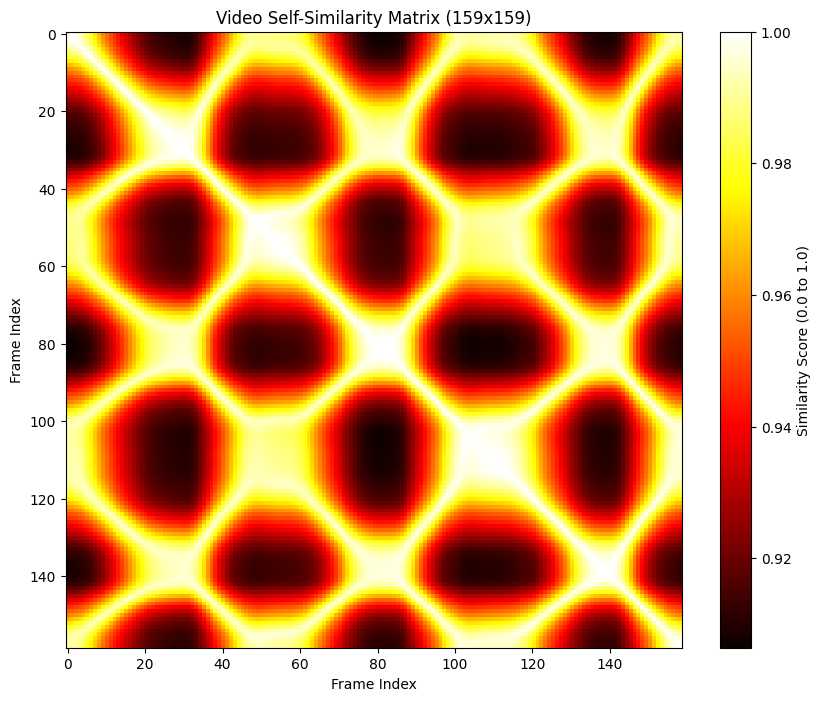

array([[1.        , 0.99890488, 0.99689661, ..., 0.99137111, 0.99168193,
        0.9913241 ],
       [0.99890488, 1.        , 0.99833708, ..., 0.99213897, 0.99152947,
        0.99107498],
       [0.99689661, 0.99833708, 1.        , ..., 0.99197039, 0.99077881,
        0.99018848],
       ...,
       [0.99137111, 0.99213897, 0.99197039, ..., 1.        , 0.9980744 ,
        0.99712144],
       [0.99168193, 0.99152947, 0.99077881, ..., 0.9980744 , 1.        ,
        0.99926821],
       [0.9913241 , 0.99107498, 0.99018848, ..., 0.99712144, 0.99926821,
        1.        ]], shape=(159, 159))

In [2]:
def generate_video_similarity_matrix(video_path, resize_dim=(64, 64), save_and_show=True):
    cap = cv2.VideoCapture(video_path)
    frames = []

    print("Reading video frames...")
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # 1. Pre-process: Convert to grayscale and resize
        # We resize to (64, 64) to make the calculation fast and memory-efficient.
        # High resolution is not needed for global similarity matching.
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        resized = cv2.resize(gray, resize_dim)
        
        # 2. Flatten: Turn 2D image into 1D array of pixels
        flat = resized.flatten()
        frames.append(flat)

    cap.release()
    
    # Convert list to a Matrix (N_frames x N_pixels)
    # e.g., for 100 frames and 64x64 img: (100, 4096)
    video_matrix = np.array(frames)
    n_frames = video_matrix.shape[0]

    print(f"Video loaded. Shape: {n_frames} frames.")

    if n_frames == 0:
        print("Error: No frames found.")
        return

    print("Calculating Similarity Matrix (N x N)...")

    # 3. Calculate Cosine Similarity
    # This computes the similarity between every frame against every other frame.
    # Result is a square matrix (N_frames x N_frames)
    # Values range from 0 (completely different) to 1 (identical)
    sim_matrix = cosine_similarity(video_matrix)

    if save_and_show:
        # 4. Plotting the Heatmap
        plt.figure(figsize=(10, 8))
        plt.imshow(sim_matrix, cmap='hot', interpolation='nearest')
        plt.colorbar(label='Similarity Score (0.0 to 1.0)')
        plt.title(f'Video Self-Similarity Matrix ({n_frames}x{n_frames})')
        plt.xlabel('Frame Index')
        plt.ylabel('Frame Index')
        
        # Save the plot
        output_filename = "video_similarity_matrix.png"
        plt.savefig(output_filename)
        
        # Save the raw numpy matrix
        # np.save("video_similarity_matrix.npy", sim_matrix)
        
        print(f"Success! Saved heatmap to '{output_filename}' and data to .npy")
        plt.show()

    return sim_matrix

generate_video_similarity_matrix('video-data/3_sdfjwaiejflkasjdf.mp4')

In [3]:
class RepetitionCounterNet(nn.Module):
    def __init__(self, num_classes=NUM_CLASSES):
        super(RepetitionCounterNet, self).__init__()
        
        # Block 1: Detect Edges & Gradient changes (The boundaries of the bright spots)
        # Input: (Batch, 1, 128, 128)
        self.layer1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)  # Out: 64x64
        )
        
        # Block 2: Detect "Blob" or "Grid" patterns
        self.layer2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)  # Out: 32x32
        )
        
        # Block 3: Capture the "Density" of the repetition (How frequent is the pattern?)
        self.layer3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)  # Out: 16x16
        )

        # Block 4: Deep semantic features
        self.layer4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            # We stop pooling here to keep some spatial resolution before averaging
        )

        # Classifier Head using Global Average Pooling
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1)) # Smashes (256, 16, 16) -> (256, 1, 1)
        self.fc = nn.Linear(256, num_classes) 


    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        # Global Average Pooling
        # This calculates the mean activation of every filter across the entire image.
        # It effectively asks: "On average, how much 'repetition texture' did we see?"
        x = self.global_pool(x)
        
        # Flatten for the final linear layer
        x = x.view(x.size(0), -1) 
        x = self.fc(x)
        return x

In [4]:
class MatrixAugmenter:
    
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, matrix):
        """Makes the class callable so it works as a transform."""
        # Chain the augmentations
        matrix = self.add_noise(matrix)
        matrix = self.time_warp_crop(matrix)
        matrix = self.random_cutout(matrix)

        return matrix

    def add_noise(self, matrix, noise_factor=0.05):
        
        if np.random.rand() > self.p: return matrix
        noise = np.random.normal(0, noise_factor, matrix.shape)
        return np.clip(matrix + noise, 0.0, 1.0)

    def time_warp_crop(self, matrix, zoom_range=(0.8, 1.2)):

        if np.random.rand() > self.p: return matrix
        
        h, w = matrix.shape
        scale = np.random.uniform(*zoom_range)
        new_h, new_w = int(h * scale), int(w * scale)
        resized = cv2.resize(matrix, (new_w, new_h))

        if scale > 1.0: # Zoom in (Crop)
            start_h, start_w = (new_h - h) // 2, (new_w - w) // 2
            return resized[start_h:start_h+h, start_w:start_w+w]
        
        else: # Zoom out (Pad)
            pad_h, pad_w = (h - new_h) // 2, (w - new_w) // 2
            augmented = np.zeros((h, w), dtype=matrix.dtype)
            augmented[pad_h:pad_h+new_h, pad_w:pad_w+new_w] = resized

            return augmented

    def random_cutout(self, matrix, max_cut_size=20):

        if np.random.rand() > self.p: return matrix

        h, w = matrix.shape
        y, x = np.random.randint(0, h), np.random.randint(0, w)
        y1, x1 = np.clip(y - max_cut_size // 2, 0, h), np.clip(x - max_cut_size // 2, 0, w)
        y2, x2 = np.clip(y + max_cut_size // 2, 0, h), np.clip(x + max_cut_size // 2, 0, w)
        matrix[y1:y2, x1:x2] = 0.0

        return matrix


class SimilarityMatrixDataset(Dataset):
    def __init__(self, video_dir, matrix_size=(128, 128), transform=None, file_list=None):
        self.video_dir = video_dir
        self.matrix_size = matrix_size
        self.transform = transform

        # Get list of files
        if file_list is None:
            self.video_files = [f for f in os.listdir(video_dir) if f.endswith(VIDEO_EXTENSIONS)]
        else:
            self.video_files = [f for f in file_list if f.endswith(VIDEO_EXTENSIONS)]

        # Extract labels (Expects format like "1_video.mp4")
        self.labels = [int(f.split('_')[0]) - 1 for f in self.video_files]

    def __len__(self):
        return len(self.video_files)

    def __getitem__(self, idx):
        video_path = os.path.join(self.video_dir, self.video_files[idx])
        label = self.labels[idx]
        
        # 1. Generate Matrix (Returns Numpy float32)
        matrix = self._compute_similarity_matrix(video_path)

        # 2. Apply Transform (Returns Numpy float32)
        if self.transform:
            matrix = self.transform(matrix)

        # 3. FIXED: Consistent Tensor Conversion
        # Convert to Tensor and add Channel dim: (H, W) -> (1, H, W)
        matrix_tensor = torch.tensor(matrix, dtype=torch.float32).unsqueeze(0)

        return matrix_tensor, label

    def _compute_similarity_matrix(self, path):
        cap = cv2.VideoCapture(path)
        frames_flat = []
        calc_dim = (64, 64) 

        while True:
            ret, frame = cap.read()
            if not ret:
                break
            
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            frames_flat.append(cv2.resize(gray, calc_dim).flatten())

        cap.release()

        # Handle empty video edge case
        if len(frames_flat) == 0:
            return np.zeros(self.matrix_size, dtype=np.float32)

        # --- FIX STARTS HERE ---
        
        # 1. Convert to float32 immediately
        video_matrix = np.array(frames_flat, dtype=np.float32)
        
        # 2. Normalize pixel values to 0-1 range
        # This prevents "Overflow" by keeping dot products small.
        video_matrix /= 255.0
        
        # 3. Add Epsilon to prevent "Divide by Zero"
        # If a frame is perfectly black, its norm is 0. Adding 1e-6 prevents the crash.
        video_matrix += 1e-6
        
        # --- FIX ENDS HERE ---

        # Now safe to compute
        sim_matrix = cosine_similarity(video_matrix)

        # Resize to target matrix size
        final_matrix = cv2.resize(sim_matrix, (self.matrix_size[1], self.matrix_size[0]))
        
        # Clip just in case numerical errors pushed values slightly outside -1 to 1
        final_matrix = np.clip(final_matrix, -1.0, 1.0)
        
        return final_matrix.astype(np.float32)

In [5]:
def get_debug_batch(dataset, batch_size=8):
    """
    Simulates a DataLoader batch but returns filenames too.
    It calls the dataset's __getitem__ so augmentations are still applied.
    """
    # 1. Pick random indices
    indices = random.sample(range(len(dataset)), batch_size)
    
    matrices = []
    labels = []
    filenames = []
    
    for idx in indices:
        # A. Call your existing __getitem__ (Triggering augmentation)
        matrix, label = dataset[idx] 
        
        # B. Manually access the filename from the list
        # (Assumes your dataset has self.video_files)
        filename = dataset.video_files[idx]
        
        matrices.append(matrix)
        labels.append(label)
        filenames.append(filename)
        
    return matrices, labels, filenames

def plot_debug_batch(matrices, labels, filenames):
    """
    Plots the grid of matrices with filenames as titles.
    """
    batch_size = len(matrices)
    rows = 2
    cols = (batch_size + 1) // rows
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 8))
    axes = axes.flatten()

    for i in range(batch_size):
        # Handle Tensor vs Numpy (Just in case)
        img = matrices[i]
        if isinstance(img, torch.Tensor):
            img = img.squeeze().numpy() # Remove channel dim (1, 128, 128) -> (128, 128)
            
        lbl = labels[i]
        fname = filenames[i]

        ax = axes[i]
        ax.imshow(img, cmap='hot', vmin=0, vmax=1)
        
        # Title formatting
        short_name = fname if len(fname) < 20 else "..." + fname[-15:]
        ax.set_title(f"Label: {lbl + 1}\n{short_name}", fontsize=10)
        ax.axis('off')

    # Hide empty subplots
    for i in range(batch_size, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

In [6]:
all_files = [f for f in os.listdir(VIDEOS_DIR_PATH) if f.endswith(VIDEO_EXTENSIONS)]
train_files, val_files = train_test_split(all_files, test_size=0.2, random_state=42)

augmenter = MatrixAugmenter(p=0.5)
train_dataset = SimilarityMatrixDataset(
    video_dir=VIDEOS_DIR_PATH, 
    file_list=train_files,     # Pass specific files
    transform=augmenter,       # Use Augmentation
    matrix_size=(128, 128)
)

val_dataset = SimilarityMatrixDataset(
    video_dir=VIDEOS_DIR_PATH, 
    file_list=val_files,       # Pass specific files
    transform=None,            # NO Augmentation for validation
    matrix_size=(128, 128)
)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")

Train batches: 8
Val batches: 2


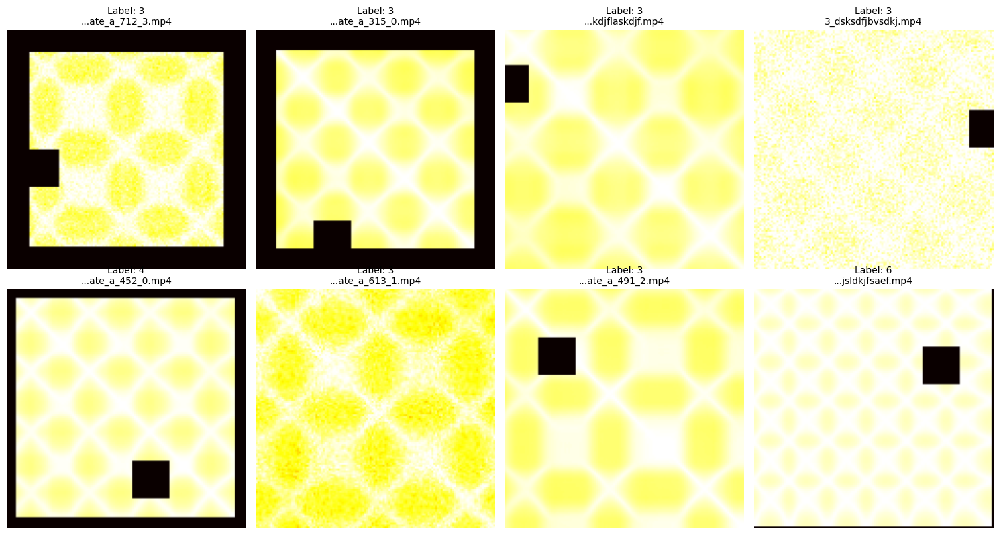

In [7]:
mats, lbls, fnames = get_debug_batch(train_dataset, batch_size=8)

# Plot it
plot_debug_batch(mats, lbls, fnames)

In [8]:
def save_gradient_plot(history, checkpoint_dir, epoch):
    """
    Plots the gradient norms for each layer over epochs.
    """
    layer_grads_history = history['layer_grads']
    epochs_range = range(1, len(layer_grads_history) + 1)
    
    # Get the list of layer names from the first epoch
    if len(layer_grads_history) == 0:
        return
    layer_names = layer_grads_history[0].keys()

    plt.figure(figsize=(12, 8))
    
    # Plot a line for each layer
    for name in layer_names:
        # Extract the norm for this specific layer across all epochs
        norms = [epoch_data[name] for epoch_data in layer_grads_history]
        plt.plot(epochs_range, norms, label=name, marker='o')

    plt.title('Layer-wise Gradient Norms (Weight Updates)')
    plt.xlabel('Epochs')
    plt.ylabel('Gradient L2 Norm')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside to avoid clutter
    plt.grid(True)
    plt.yscale('log') # Log scale is often better for gradients
    
    plt.tight_layout()
    plot_path = os.path.join(checkpoint_dir, f'layer_gradients_{epoch}.png')
    plt.savefig(plot_path)
    print(f"Layer gradient plot saved to {plot_path}")
    plt.show()

    
def save_plots(history, checkpoint_dir, epoch):
    epochs_range = range(1, len(history['train_loss']) + 1)

    # Create a figure with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # --- Subplot 1: Loss Dynamics ---
    ax1.plot(epochs_range, history['train_loss'], label='Training Loss', marker='o', color='tab:blue')
    ax1.plot(epochs_range, history['val_loss'], label='Validation Loss', marker='o', color='tab:orange')
    ax1.set_title('Training vs Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    # --- Subplot 2: Accuracy Dynamics ---
    ax2.plot(epochs_range, history['train_acc'], label='Train Accuracy', marker='o', color='tab:blue')
    ax2.plot(epochs_range, history['val_acc'], label='Validation Accuracy', marker='o', color='tab:orange')
    ax2.set_title('Training vs Validation Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True)

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Save to file
    combined_plot_path = os.path.join(checkpoint_dir, f'training_dynamics_{epoch}.png')
    plt.savefig(combined_plot_path)
    print(f"Combined plot saved to {combined_plot_path}")

    # Display the plot
    plt.show()


def get_layer_grad_norms(model):
    """
    Returns a dictionary of gradient norms for each layer's weights.
    Example: {'conv1.weight': 0.12, 'fc.weight': 0.55}
    """
    layer_norms = {}
    for name, param in model.named_parameters():
        if param.grad is not None and 'weight' in name:
            # Calculate L2 norm for this specific layer
            norm = param.grad.data.norm(2).item()
            layer_norms[name] = norm
    return layer_norms

def _plot_weight_histograms(all_weights, layer_names, checkpoint_dir, epoch):
    """
    Helper function to visualize weight distributions.
    Ideally, we want bell curves (Gaussian). 
    Rectangles = Bad init. Spikes at 0 = Dead ReLUs.
    """
    num_layers = len(layer_names)
    # Limit plots to first 6 trainable layers to avoid clutter
    display_limit = min(num_layers, 6) 
    
    plt.figure(figsize=(15, 4))
    plt.suptitle("Weight Distribution (First 6 Trainable Layers)", fontsize=14)
    
    for i in range(display_limit):
        plt.subplot(1, display_limit, i+1)
        plt.hist(all_weights[i], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
        plt.title(layer_names[i].split('.')[-1], fontsize=10) # Shorten name
        plt.yticks([]) # Hide y-axis for cleanliness
        plt.grid(axis='x', alpha=0.3)
        
    plt.tight_layout()
    plot_path = os.path.join(checkpoint_dir, f'weight_histograms_{epoch}.png')
    plt.savefig(plot_path)

    plt.show()

def diagnose_internal_health(model, checkpoint_dir, epoch, plot_histograms=True):
    """
    Diagnoses the internal state of the model:
    1. Checks if Frozen layers are truly configured as non-trainable.
    2. Checks Weight Norms for Regularization issues (Vanishing/Exploding).
    3. Plots Histograms of weight distributions (Gaussian vs. Collapsed).
    """
    print("\n--- 🩺 Model Internals Diagnosis ---")
    
    # Trackers for plotting
    all_weights = []
    layer_names = []
    
    print(f"{'Layer Name':<30} | {'Trainable?':<10} | {'Weight L2 Norm':<15} | {'Status'}")
    print("-" * 85)
    
    for name, param in model.named_parameters():
        if 'weight' not in name: 
            continue # Skip biases for this check
            
        # 1. Frozen Layer Check
        # We check if the framework thinks it should train this parameter
        is_trainable = param.requires_grad
        train_status = "✅ Yes" if is_trainable else "❄️ Frozen"
        
        # 2. Regularization / Weight Norm Check
        # L2 Norm: sqrt(sum(w^2)) - indicates if weights are vanishing or exploding
        l2_norm = torch.norm(param).item()
        
        health_status = "OK"
        if l2_norm < 1e-4:
            health_status = "⚠️ Vanishing (Dead?)"
        elif l2_norm > 50.0:
            health_status = "⚠️ Exploding (High Reg needed?)"
            
        print(f"{name:<30} | {train_status:<10} | {l2_norm:.4f}          | {health_status}")
        
        # Collect for histogram
        if plot_histograms and is_trainable:
            all_weights.append(param.data.cpu().numpy().flatten())
            layer_names.append(name)

    print("-" * 85)

    # 3. Histogram Visualization
    if plot_histograms and len(all_weights) > 0:
        _plot_weight_histograms(all_weights, layer_names, checkpoint_dir, epoch)


In [9]:
class EMDLoss(nn.Module):
    """
    Simple Earth Mover's Distance (EMD) / ordinal loss for classification.
    Assumes inputs are logits of shape (N, C) and targets are integer class labels (N,).
    Computes squared L2 distance between cumulative distributions (CDFs).
    """

    def __init__(self, reduction='mean'):
        super(EMDLoss, self).__init__()
        self.reduction = reduction


    def forward(self, input, target):
        # input: logits (N, C)
        # target: (N,) ints or (N, C) one-hot
        if target.dim() == 1:
            target_onehot = F.one_hot(target, num_classes=input.size(1)).float()
        else:
            target_onehot = target.float()

        prob = F.softmax(input, dim=1)
        cdf_pred = torch.cumsum(prob, dim=1)
        cdf_true = torch.cumsum(target_onehot, dim=1)

        # Squared EMD per sample
        sample_emd = torch.sum((cdf_pred - cdf_true) ** 2, dim=1)

        if self.reduction == 'mean':
            return sample_emd.mean()
        elif self.reduction == 'sum':
            return sample_emd.sum()
        else:
            return sample_emd


In [10]:
def validate_repetition_model(model, val_loader, criterion=None,  device=DEVICE):
    """
    Evaluates the model on the validation set and prints accuracy/loss.
    """

    model.to(device)
    model.eval()

    if criterion is None:
        criterion = EMDLoss()

    print(f"Starting validation on {device}...")
    
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            # Forward pass
            outputs = model(inputs)
            
            # Calculate Loss
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            # Calculate Accuracy
            # torch.max returns (max_value, index_of_max_value)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    # 4. Calculate Final Metrics
    avg_loss = val_loss / len(val_loader)
    accuracy = 100 * correct / total

    print(f"Validation Results:")
    print(f" - Average Loss: {avg_loss:.4f}")
    print(f" - Accuracy:     {accuracy:.2f}% ({correct}/{total})")

    return avg_loss, accuracy


def train_repetition_model(model, train_loader, val_loader, 
                           epochs=NUM_EPOCHS, lr=LEARNING_RATE, device=DEVICE, checkpoint_dir=CHECKPOINT_DIR):
    """
    Training loop that tracks dynamics and saves plots.
    """

    # 0. Setup Checkpoint Directory
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
        print(f"Created checkpoint directory: {checkpoint_dir}")

    # 1. Setup Model & Optimizer
    model.to(device)
    criterion = EMDLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    # Update history dict to include train_acc
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [],   'val_acc': [],'layer_grads': [],
    }

    print(f"Starting training on {device}...")

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        
        # Accumulator for layer gradients across the epoch
        # We initialize it as an empty dict and populate it on the first batch
        epoch_grad_sums = {}
        batch_count = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()

            # --- Capture Layer-wise Gradients ---
            batch_layer_norms = get_layer_grad_norms(model)
            
            # Sum up gradients over batches to get epoch average later
            for name, val in batch_layer_norms.items():
                epoch_grad_sums[name] = epoch_grad_sums.get(name, 0.0) + val
            
            batch_count += 1
            
            optimizer.step()

            # Stats
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        # --- Compute Epoch Averages ---
        avg_train_loss = running_loss / len(train_loader)
        train_acc = 100 * correct_train / total_train
        
        # Average the gradients
        avg_layer_grads = {k: v / batch_count for k, v in epoch_grad_sums.items()}

        # Validation
        avg_val_loss, val_acc = validate_repetition_model(model, val_loader, criterion, device)


        # Store History
        history['train_loss'].append(avg_train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(avg_val_loss)
        history['val_acc'].append(val_acc)
        history['layer_grads'].append(avg_layer_grads) # Store the dict

        print(f"Epoch [{epoch+1}/{epochs}] Loss: {avg_train_loss:.4f} | Val Acc: {val_acc:.2f}%")

        if (epoch + 1) % 2 == 0: 
            save_plots(history, checkpoint_dir, epoch)
            save_gradient_plot(history, checkpoint_dir, epoch)
            diagnose_internal_health(model, checkpoint_dir, epoch, plot_histograms=True)


    return model, history

Created checkpoint directory: checkpoints
Starting training on mps...
Starting validation on mps...
Validation Results:
 - Average Loss: 1.0266
 - Accuracy:     31.25% (5/16)
Epoch [1/50] Loss: 0.9868 | Val Acc: 31.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.6851
 - Accuracy:     31.25% (5/16)
Epoch [2/50] Loss: 0.5588 | Val Acc: 31.25%
Combined plot saved to checkpoints/training_dynamics_1.png


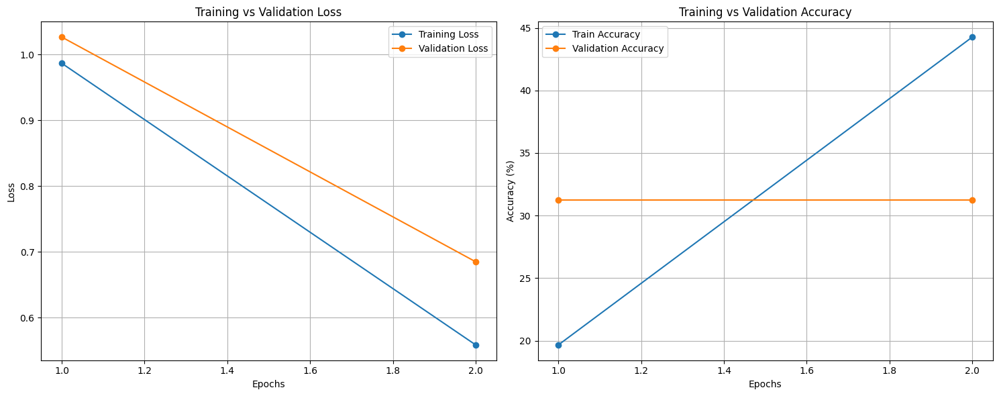

Layer gradient plot saved to checkpoints/layer_gradients_1.png


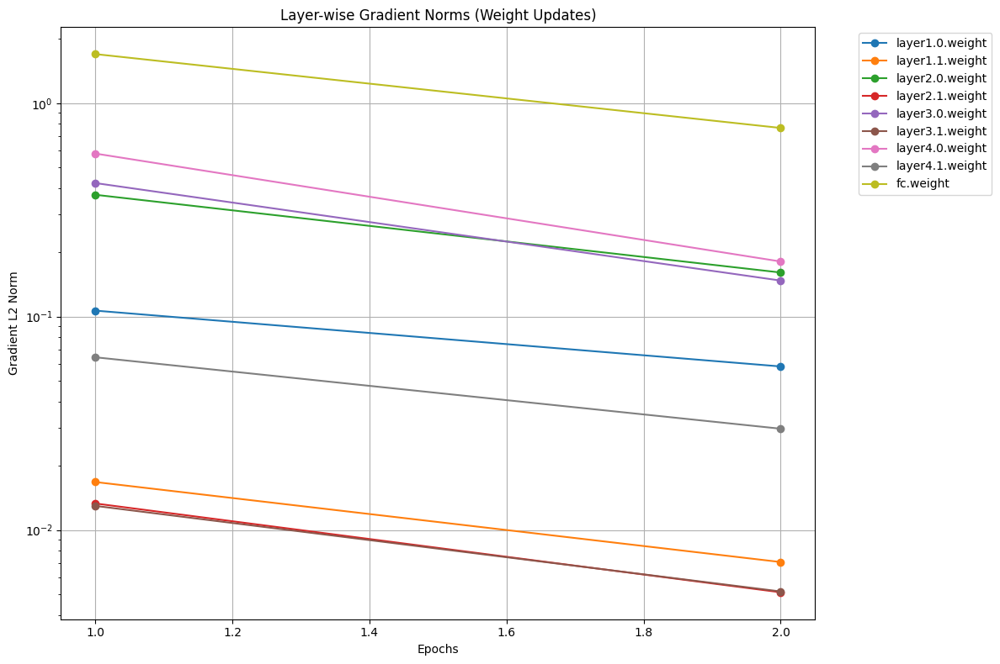


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2526          | OK
layer1.1.weight                | ✅ Yes      | 5.6592          | OK
layer2.0.weight                | ✅ Yes      | 4.6735          | OK
layer2.1.weight                | ✅ Yes      | 8.0009          | OK
layer3.0.weight                | ✅ Yes      | 6.6661          | OK
layer3.1.weight                | ✅ Yes      | 11.3179          | OK
layer4.0.weight                | ✅ Yes      | 9.6464          | OK
layer4.1.weight                | ✅ Yes      | 16.0376          | OK
fc.weight                      | ✅ Yes      | 1.8858          | OK
-------------------------------------------------------------------------------------


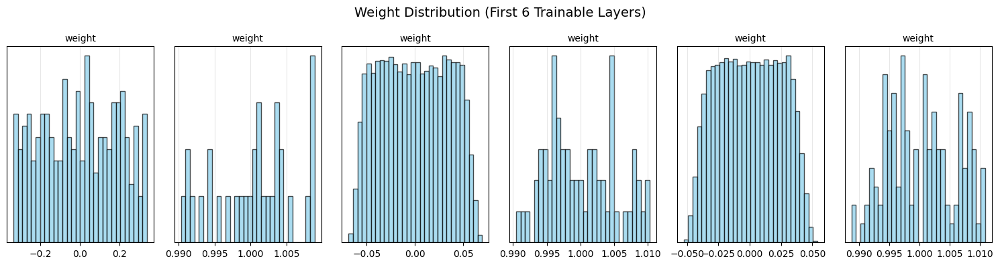

Starting validation on mps...
Validation Results:
 - Average Loss: 0.6158
 - Accuracy:     31.25% (5/16)
Epoch [3/50] Loss: 0.5591 | Val Acc: 31.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.6139
 - Accuracy:     31.25% (5/16)
Epoch [4/50] Loss: 0.4964 | Val Acc: 31.25%
Combined plot saved to checkpoints/training_dynamics_3.png


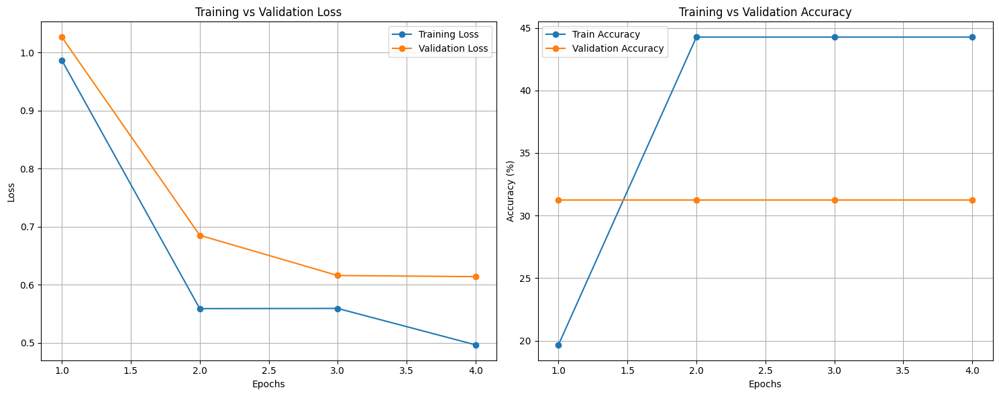

Layer gradient plot saved to checkpoints/layer_gradients_3.png


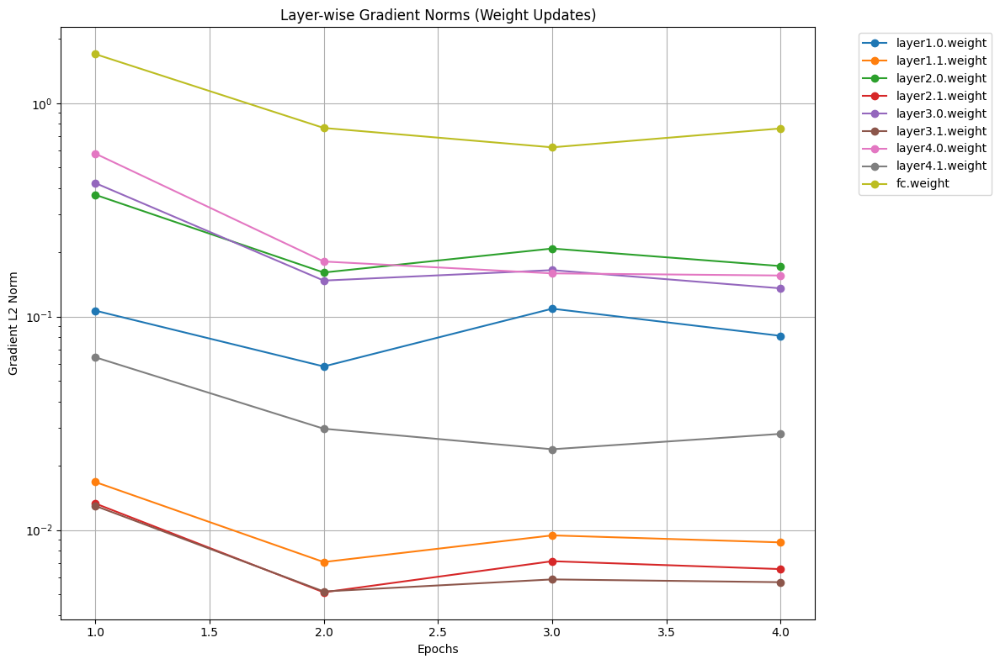


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2568          | OK
layer1.1.weight                | ✅ Yes      | 5.6575          | OK
layer2.0.weight                | ✅ Yes      | 4.6999          | OK
layer2.1.weight                | ✅ Yes      | 8.0001          | OK
layer3.0.weight                | ✅ Yes      | 6.7373          | OK
layer3.1.weight                | ✅ Yes      | 11.3193          | OK
layer4.0.weight                | ✅ Yes      | 9.8811          | OK
layer4.1.weight                | ✅ Yes      | 16.0658          | OK
fc.weight                      | ✅ Yes      | 1.9468          | OK
-------------------------------------------------------------------------------------


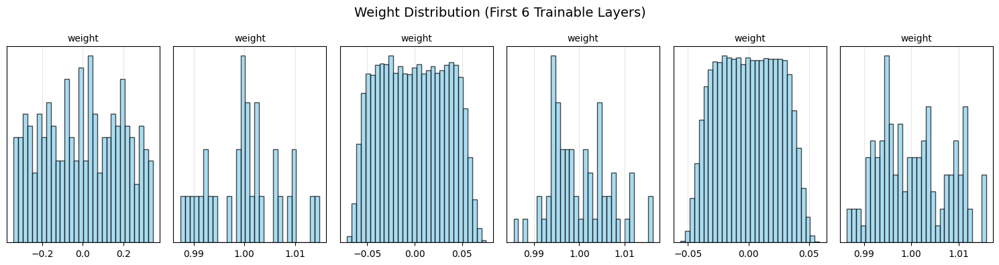

Starting validation on mps...
Validation Results:
 - Average Loss: 0.6228
 - Accuracy:     37.50% (6/16)
Epoch [5/50] Loss: 0.5346 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.5842
 - Accuracy:     37.50% (6/16)
Epoch [6/50] Loss: 0.5203 | Val Acc: 37.50%
Combined plot saved to checkpoints/training_dynamics_5.png


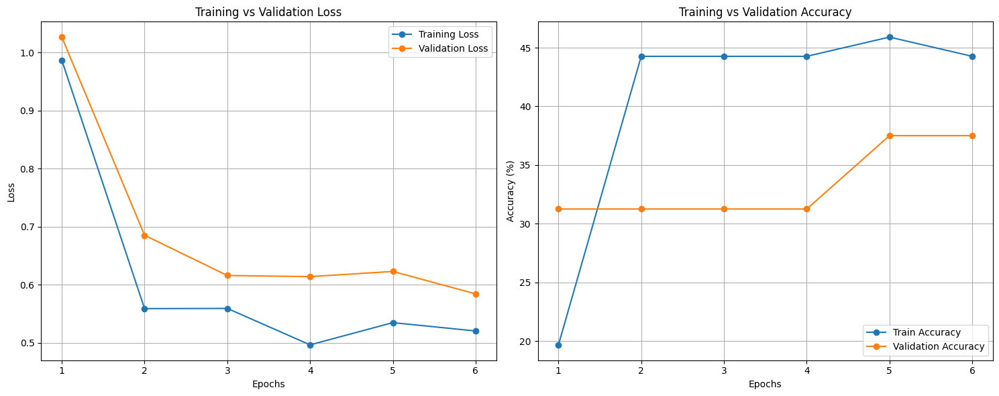

Layer gradient plot saved to checkpoints/layer_gradients_5.png


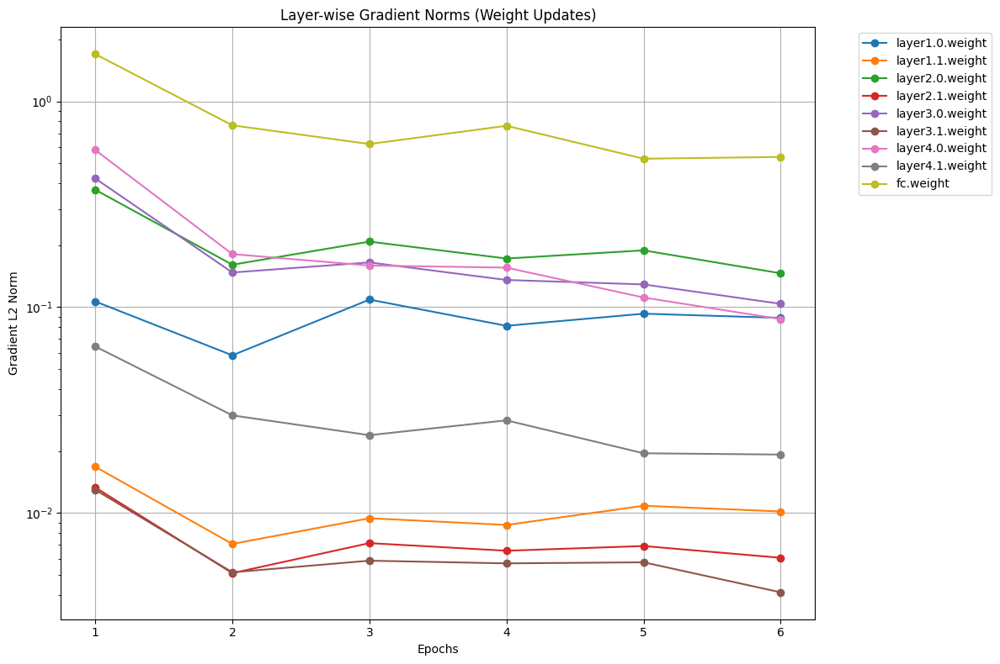


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2583          | OK
layer1.1.weight                | ✅ Yes      | 5.6577          | OK
layer2.0.weight                | ✅ Yes      | 4.7275          | OK
layer2.1.weight                | ✅ Yes      | 7.9993          | OK
layer3.0.weight                | ✅ Yes      | 6.7788          | OK
layer3.1.weight                | ✅ Yes      | 11.3195          | OK
layer4.0.weight                | ✅ Yes      | 9.9953          | OK
layer4.1.weight                | ✅ Yes      | 16.0631          | OK
fc.weight                      | ✅ Yes      | 1.9600          | OK
-------------------------------------------------------------------------------------


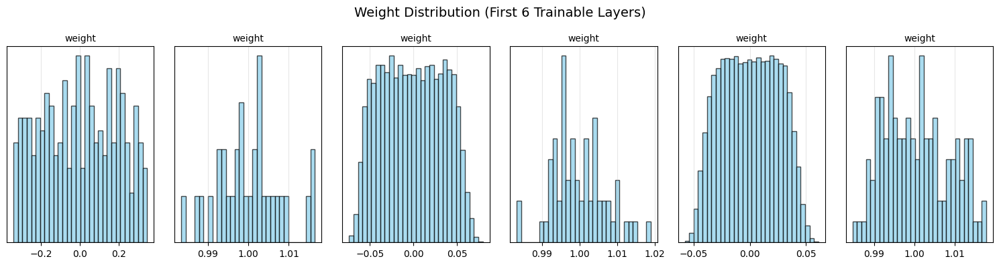

Starting validation on mps...
Validation Results:
 - Average Loss: 0.5825
 - Accuracy:     37.50% (6/16)
Epoch [7/50] Loss: 0.5214 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.5780
 - Accuracy:     31.25% (5/16)
Epoch [8/50] Loss: 0.5107 | Val Acc: 31.25%
Combined plot saved to checkpoints/training_dynamics_7.png


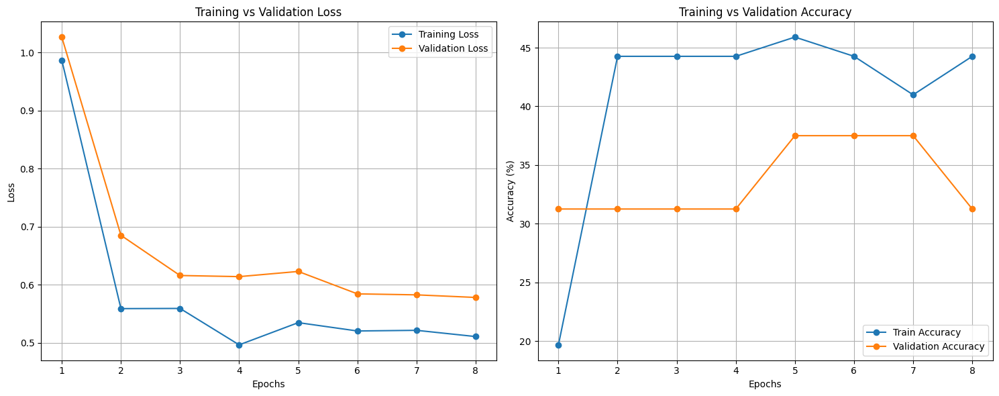

Layer gradient plot saved to checkpoints/layer_gradients_7.png


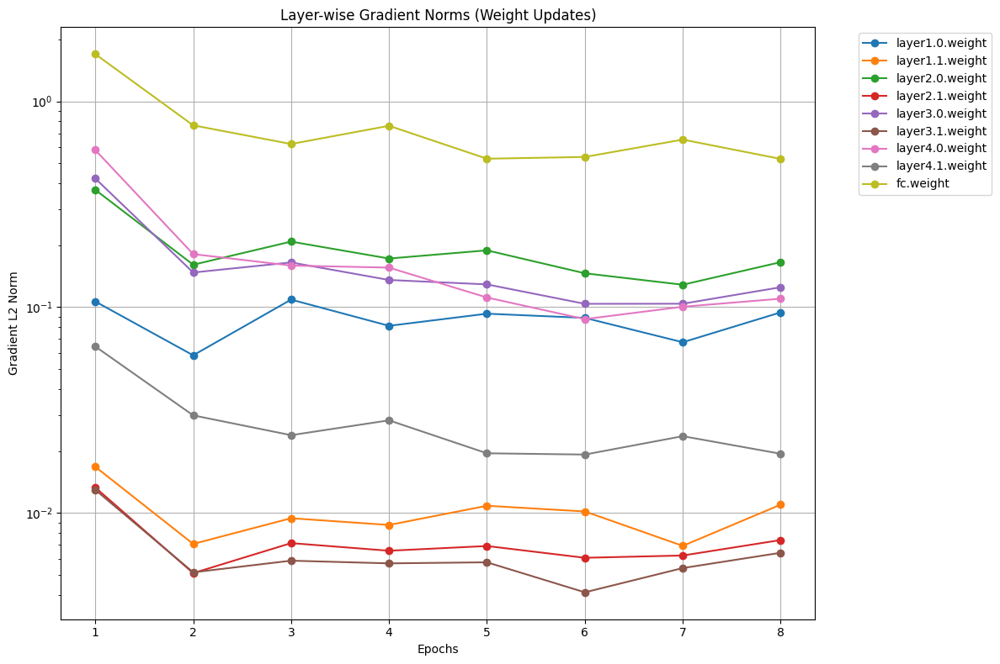


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2598          | OK
layer1.1.weight                | ✅ Yes      | 5.6585          | OK
layer2.0.weight                | ✅ Yes      | 4.7460          | OK
layer2.1.weight                | ✅ Yes      | 7.9993          | OK
layer3.0.weight                | ✅ Yes      | 6.8104          | OK
layer3.1.weight                | ✅ Yes      | 11.3189          | OK
layer4.0.weight                | ✅ Yes      | 10.0593          | OK
layer4.1.weight                | ✅ Yes      | 16.0547          | OK
fc.weight                      | ✅ Yes      | 1.9588          | OK
-------------------------------------------------------------------------------------


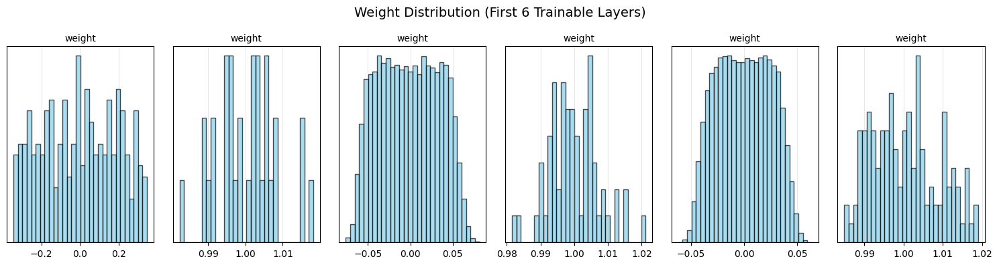

Starting validation on mps...
Validation Results:
 - Average Loss: 0.5563
 - Accuracy:     37.50% (6/16)
Epoch [9/50] Loss: 0.5143 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.5785
 - Accuracy:     31.25% (5/16)
Epoch [10/50] Loss: 0.5133 | Val Acc: 31.25%
Combined plot saved to checkpoints/training_dynamics_9.png


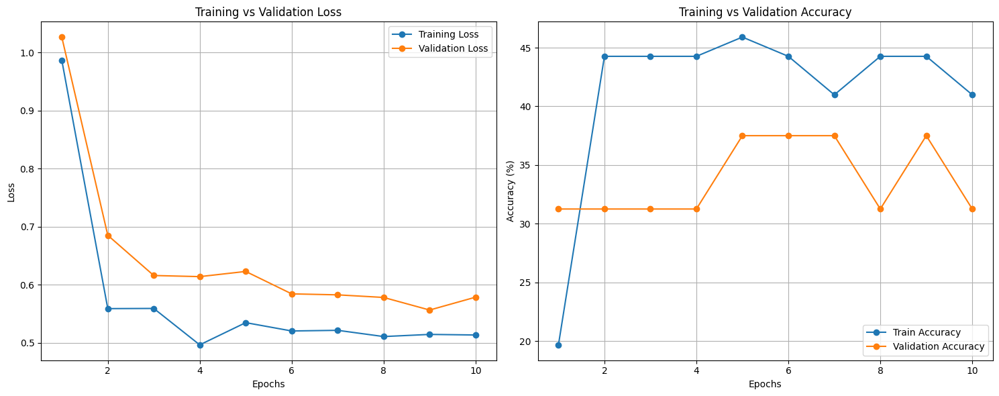

Layer gradient plot saved to checkpoints/layer_gradients_9.png


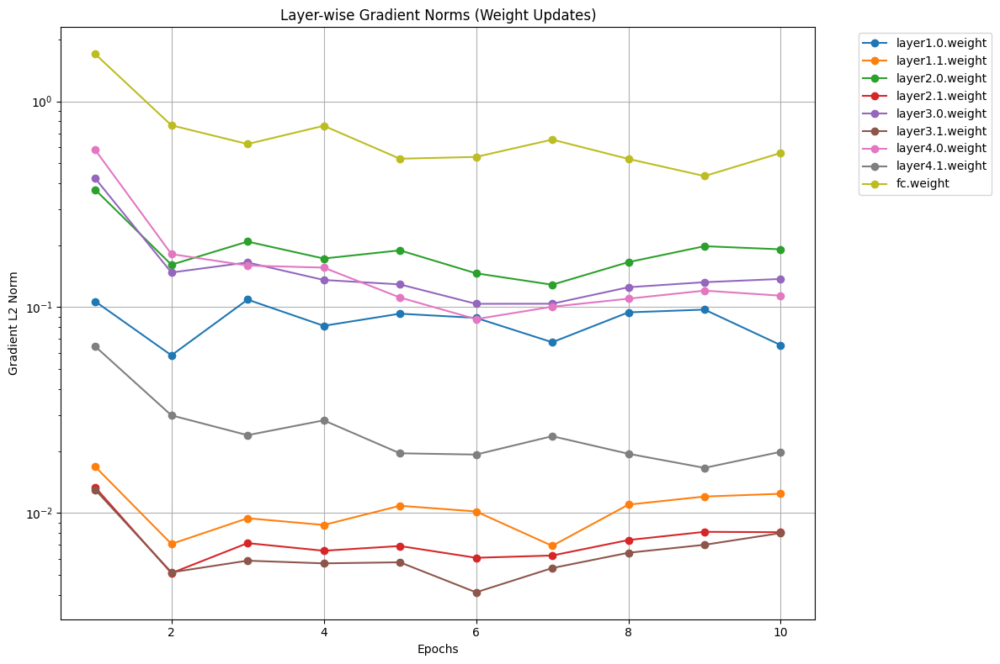


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2628          | OK
layer1.1.weight                | ✅ Yes      | 5.6582          | OK
layer2.0.weight                | ✅ Yes      | 4.7627          | OK
layer2.1.weight                | ✅ Yes      | 7.9990          | OK
layer3.0.weight                | ✅ Yes      | 6.8412          | OK
layer3.1.weight                | ✅ Yes      | 11.3207          | OK
layer4.0.weight                | ✅ Yes      | 10.1221          | OK
layer4.1.weight                | ✅ Yes      | 16.0515          | OK
fc.weight                      | ✅ Yes      | 1.9600          | OK
-------------------------------------------------------------------------------------


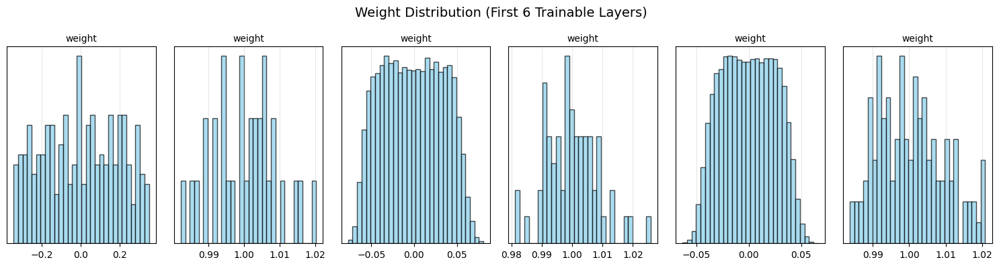

Starting validation on mps...
Validation Results:
 - Average Loss: 0.6354
 - Accuracy:     31.25% (5/16)
Epoch [11/50] Loss: 0.5120 | Val Acc: 31.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.6619
 - Accuracy:     18.75% (3/16)
Epoch [12/50] Loss: 0.4993 | Val Acc: 18.75%
Combined plot saved to checkpoints/training_dynamics_11.png


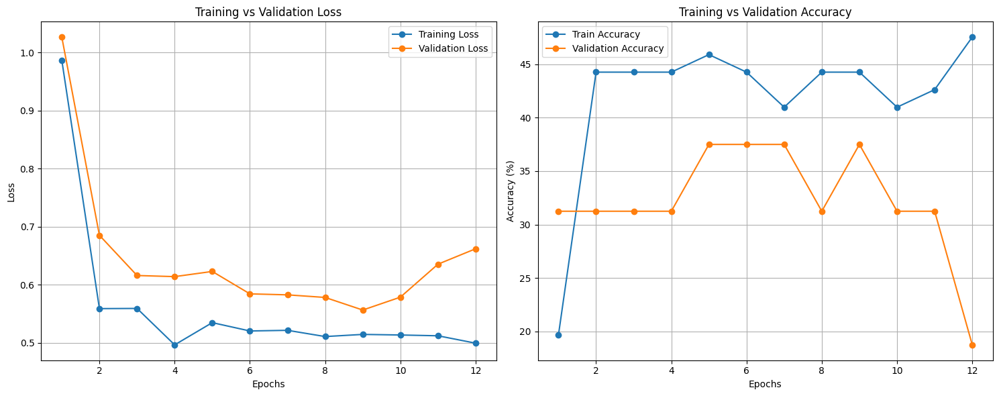

Layer gradient plot saved to checkpoints/layer_gradients_11.png


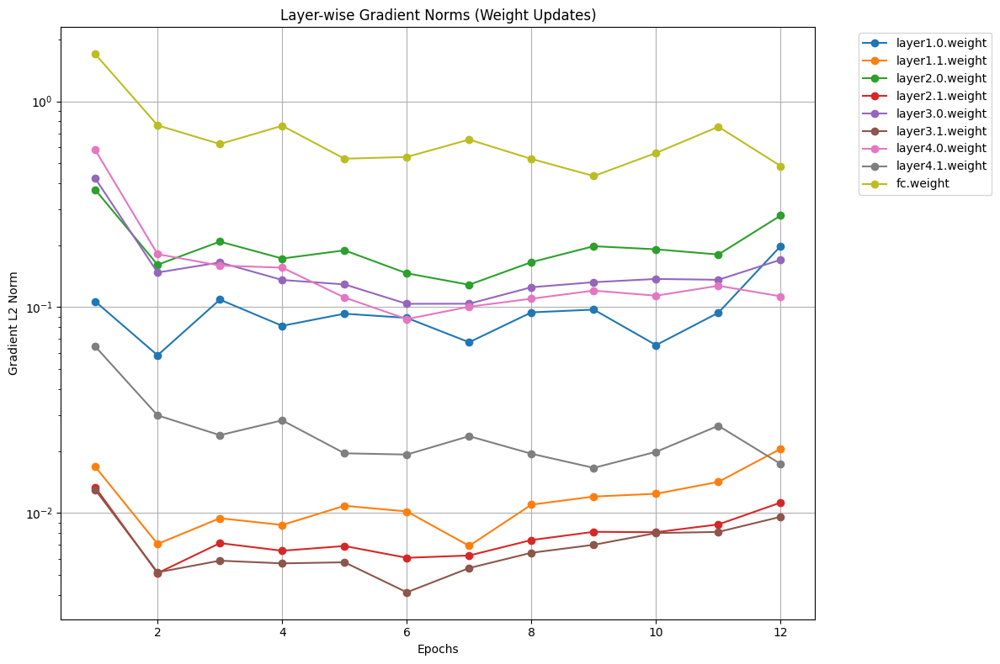


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2636          | OK
layer1.1.weight                | ✅ Yes      | 5.6594          | OK
layer2.0.weight                | ✅ Yes      | 4.7913          | OK
layer2.1.weight                | ✅ Yes      | 7.9994          | OK
layer3.0.weight                | ✅ Yes      | 6.8825          | OK
layer3.1.weight                | ✅ Yes      | 11.3208          | OK
layer4.0.weight                | ✅ Yes      | 10.1968          | OK
layer4.1.weight                | ✅ Yes      | 16.0518          | OK
fc.weight                      | ✅ Yes      | 1.9632          | OK
-------------------------------------------------------------------------------------


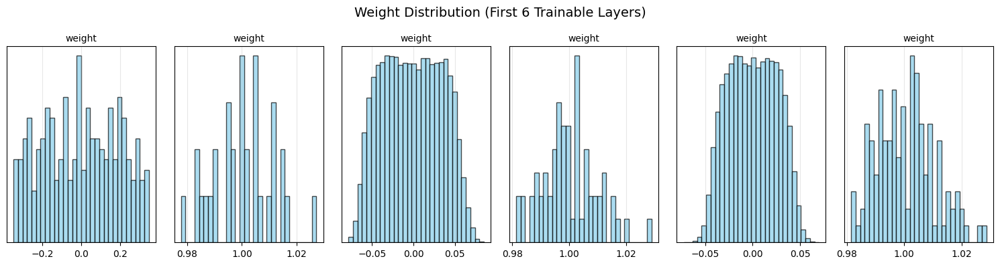

Starting validation on mps...
Validation Results:
 - Average Loss: 0.6442
 - Accuracy:     18.75% (3/16)
Epoch [13/50] Loss: 0.4894 | Val Acc: 18.75%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.8223
 - Accuracy:     18.75% (3/16)
Epoch [14/50] Loss: 0.4942 | Val Acc: 18.75%
Combined plot saved to checkpoints/training_dynamics_13.png


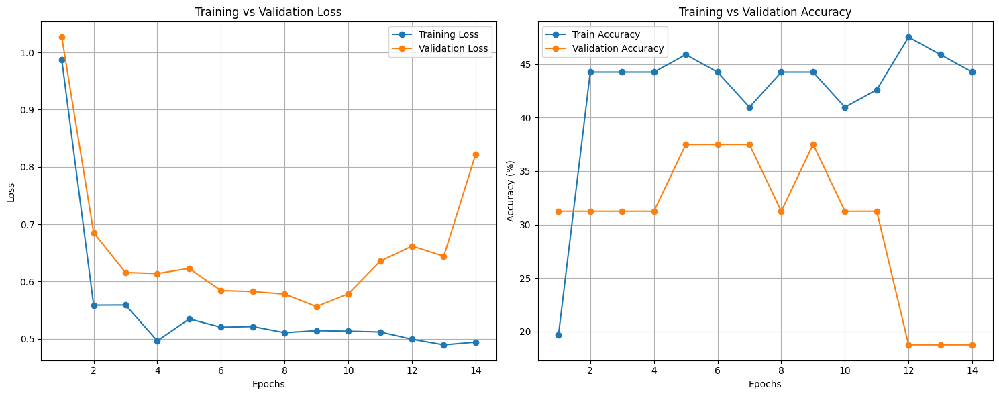

Layer gradient plot saved to checkpoints/layer_gradients_13.png


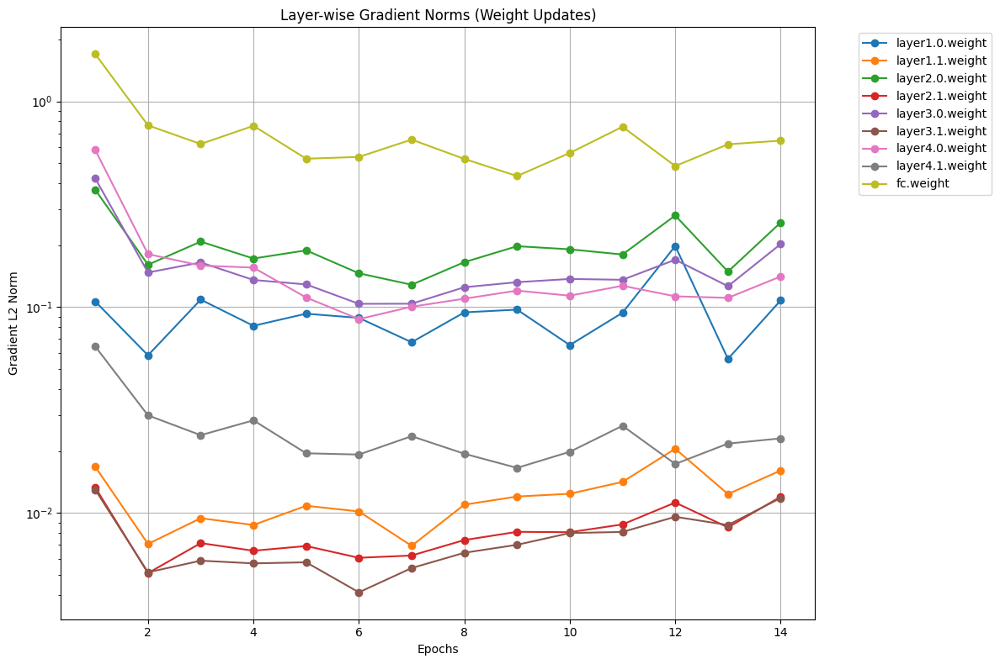


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2729          | OK
layer1.1.weight                | ✅ Yes      | 5.6590          | OK
layer2.0.weight                | ✅ Yes      | 4.8280          | OK
layer2.1.weight                | ✅ Yes      | 7.9993          | OK
layer3.0.weight                | ✅ Yes      | 6.9473          | OK
layer3.1.weight                | ✅ Yes      | 11.3206          | OK
layer4.0.weight                | ✅ Yes      | 10.2822          | OK
layer4.1.weight                | ✅ Yes      | 16.0607          | OK
fc.weight                      | ✅ Yes      | 1.9740          | OK
-------------------------------------------------------------------------------------


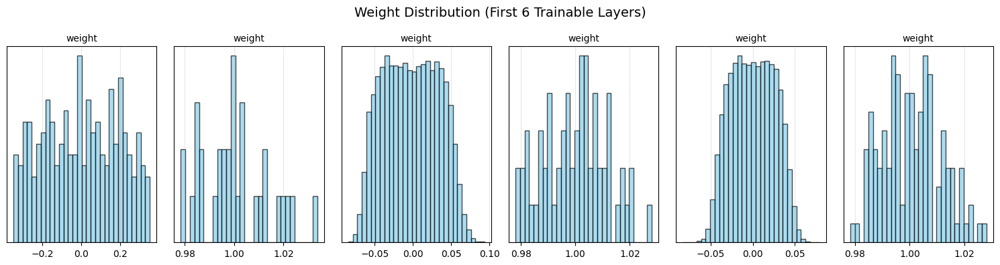

Starting validation on mps...
Validation Results:
 - Average Loss: 0.9100
 - Accuracy:     12.50% (2/16)
Epoch [15/50] Loss: 0.4651 | Val Acc: 12.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.6555
 - Accuracy:     18.75% (3/16)
Epoch [16/50] Loss: 0.4741 | Val Acc: 18.75%
Combined plot saved to checkpoints/training_dynamics_15.png


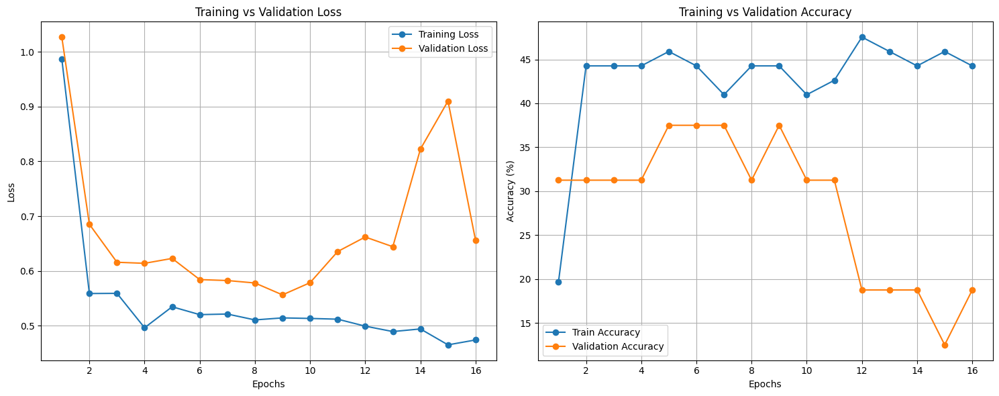

Layer gradient plot saved to checkpoints/layer_gradients_15.png


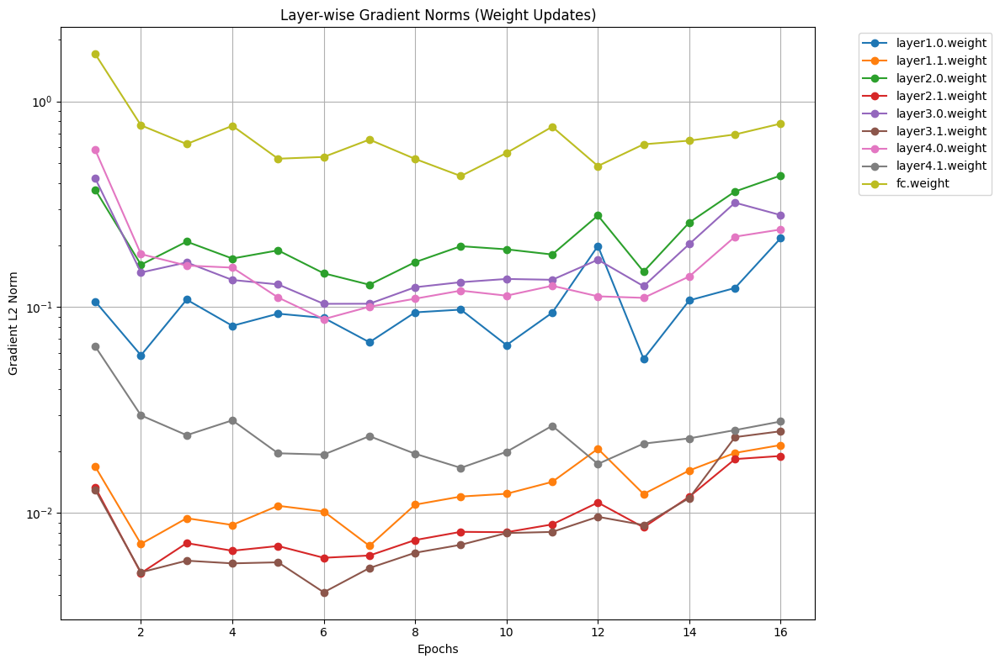


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2805          | OK
layer1.1.weight                | ✅ Yes      | 5.6581          | OK
layer2.0.weight                | ✅ Yes      | 4.8749          | OK
layer2.1.weight                | ✅ Yes      | 7.9989          | OK
layer3.0.weight                | ✅ Yes      | 7.0477          | OK
layer3.1.weight                | ✅ Yes      | 11.3137          | OK
layer4.0.weight                | ✅ Yes      | 10.4485          | OK
layer4.1.weight                | ✅ Yes      | 16.0702          | OK
fc.weight                      | ✅ Yes      | 1.9858          | OK
-------------------------------------------------------------------------------------


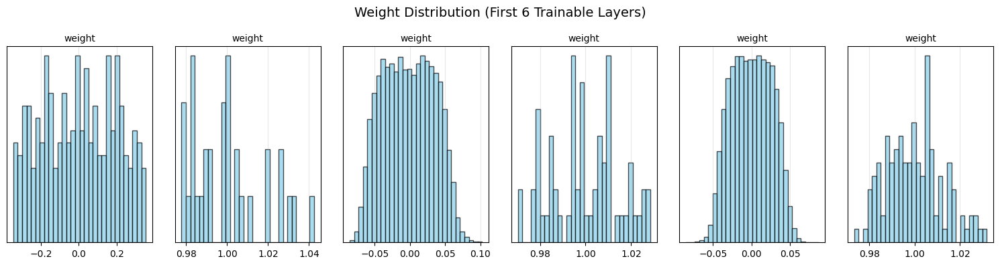

Starting validation on mps...
Validation Results:
 - Average Loss: 0.4789
 - Accuracy:     37.50% (6/16)
Epoch [17/50] Loss: 0.4576 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.5995
 - Accuracy:     37.50% (6/16)
Epoch [18/50] Loss: 0.4583 | Val Acc: 37.50%
Combined plot saved to checkpoints/training_dynamics_17.png


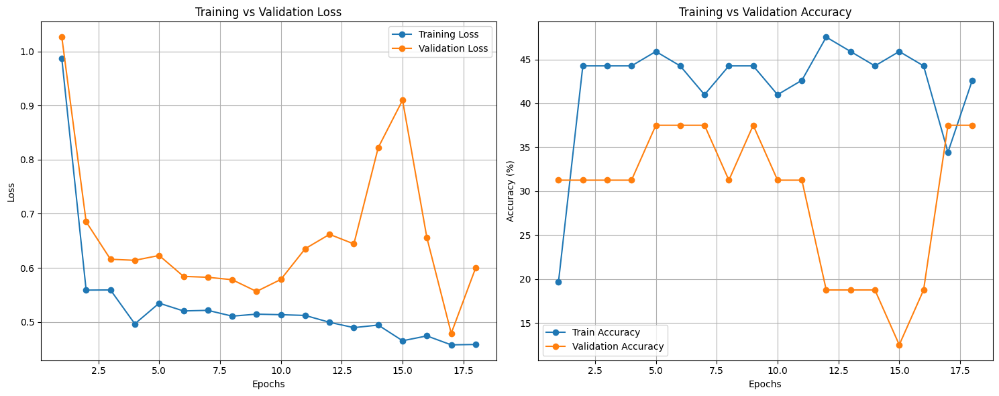

Layer gradient plot saved to checkpoints/layer_gradients_17.png


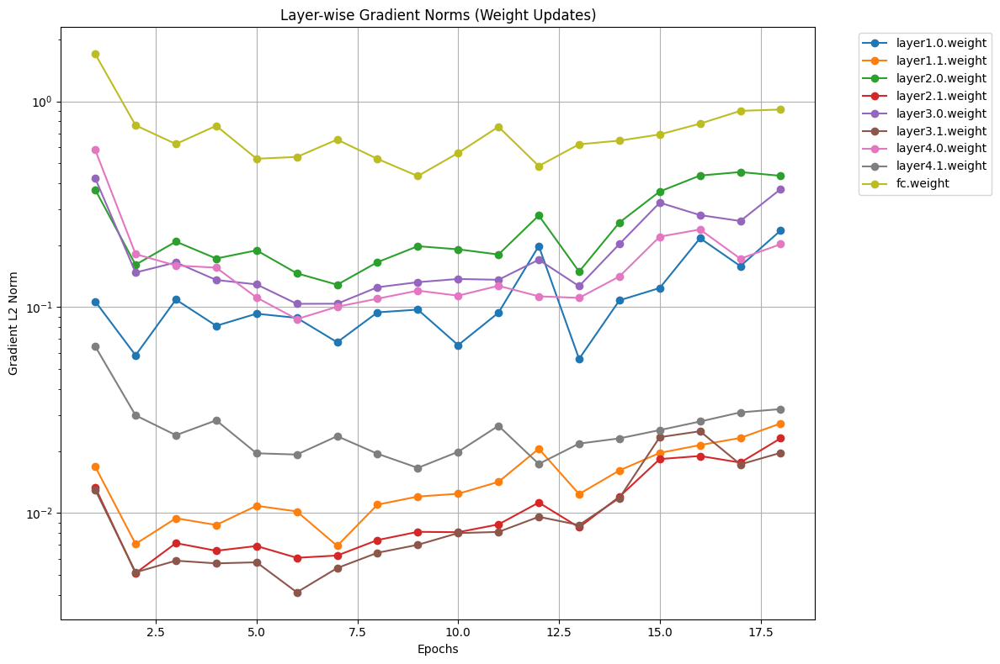


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2847          | OK
layer1.1.weight                | ✅ Yes      | 5.6596          | OK
layer2.0.weight                | ✅ Yes      | 4.9340          | OK
layer2.1.weight                | ✅ Yes      | 7.9987          | OK
layer3.0.weight                | ✅ Yes      | 7.1545          | OK
layer3.1.weight                | ✅ Yes      | 11.3120          | OK
layer4.0.weight                | ✅ Yes      | 10.6705          | OK
layer4.1.weight                | ✅ Yes      | 16.0811          | OK
fc.weight                      | ✅ Yes      | 1.9996          | OK
-------------------------------------------------------------------------------------


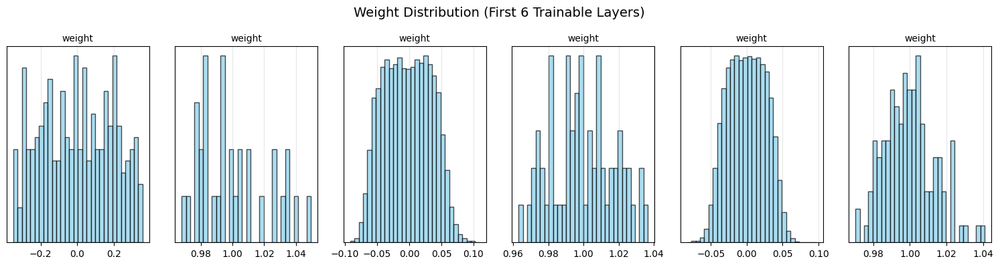

Starting validation on mps...
Validation Results:
 - Average Loss: 0.4924
 - Accuracy:     37.50% (6/16)
Epoch [19/50] Loss: 0.4470 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3884
 - Accuracy:     62.50% (10/16)
Epoch [20/50] Loss: 0.4270 | Val Acc: 62.50%
Combined plot saved to checkpoints/training_dynamics_19.png


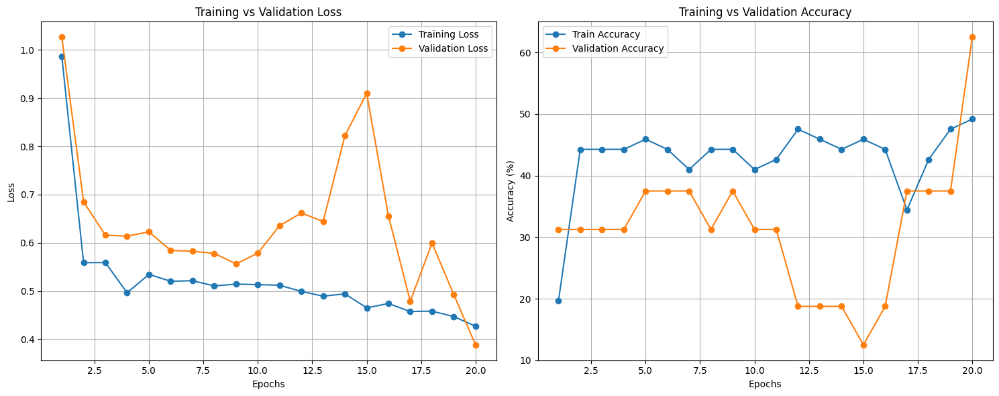

Layer gradient plot saved to checkpoints/layer_gradients_19.png


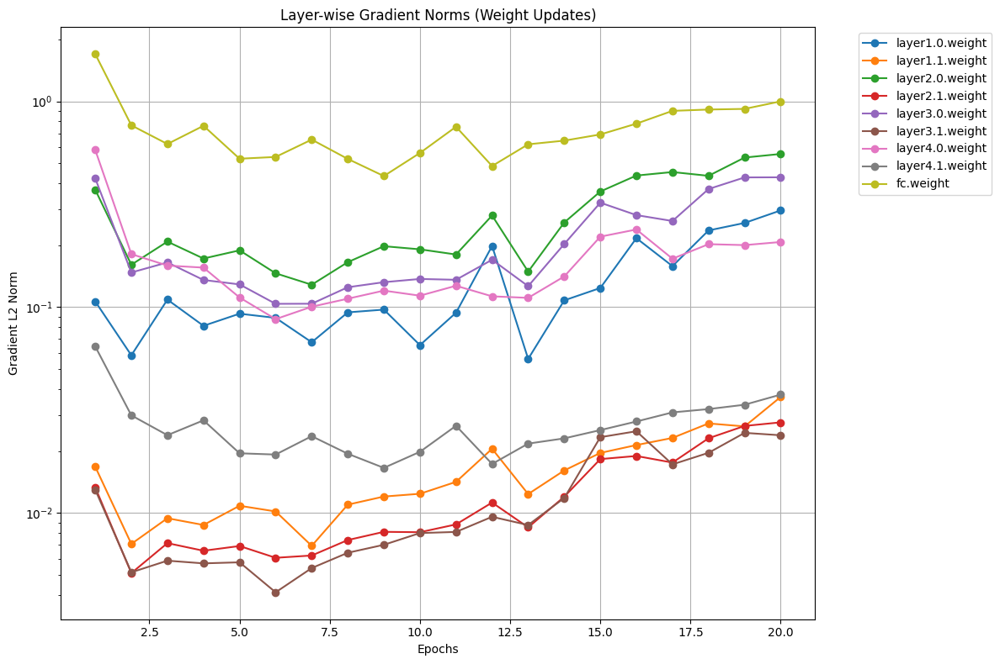


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.2937          | OK
layer1.1.weight                | ✅ Yes      | 5.6627          | OK
layer2.0.weight                | ✅ Yes      | 5.0097          | OK
layer2.1.weight                | ✅ Yes      | 7.9936          | OK
layer3.0.weight                | ✅ Yes      | 7.3066          | OK
layer3.1.weight                | ✅ Yes      | 11.3015          | OK
layer4.0.weight                | ✅ Yes      | 10.8915          | OK
layer4.1.weight                | ✅ Yes      | 16.0930          | OK
fc.weight                      | ✅ Yes      | 2.0128          | OK
-------------------------------------------------------------------------------------


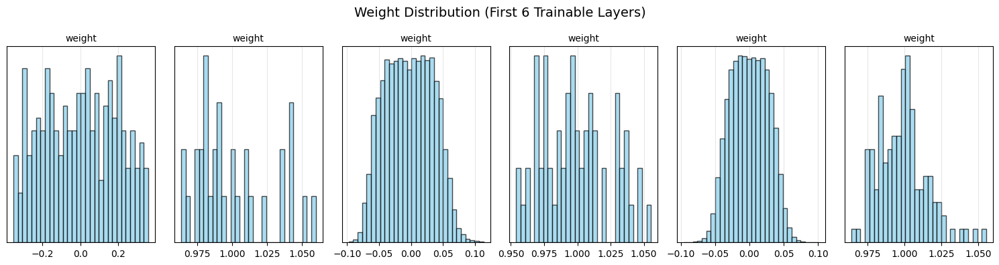

Starting validation on mps...
Validation Results:
 - Average Loss: 0.5166
 - Accuracy:     43.75% (7/16)
Epoch [21/50] Loss: 0.4988 | Val Acc: 43.75%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.6294
 - Accuracy:     25.00% (4/16)
Epoch [22/50] Loss: 0.4071 | Val Acc: 25.00%
Combined plot saved to checkpoints/training_dynamics_21.png


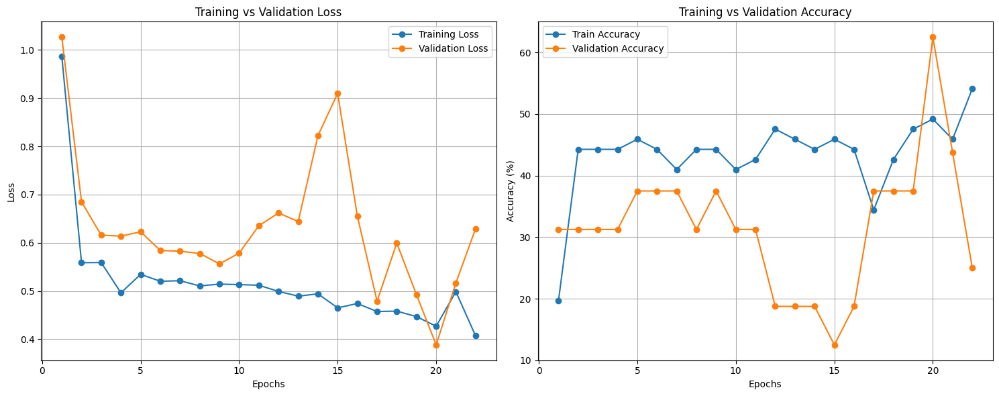

Layer gradient plot saved to checkpoints/layer_gradients_21.png


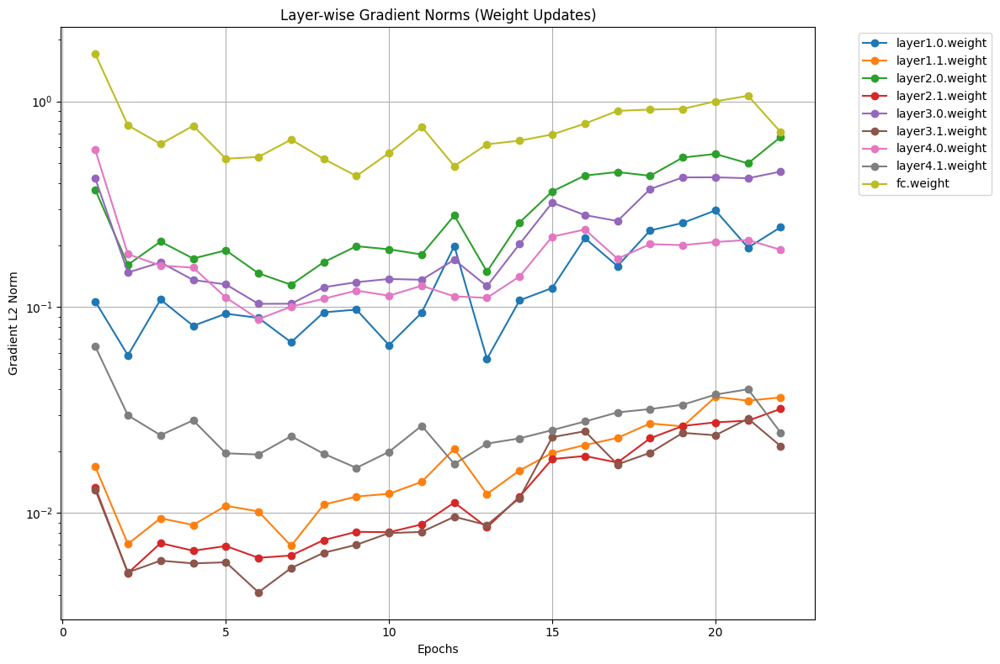


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3073          | OK
layer1.1.weight                | ✅ Yes      | 5.6624          | OK
layer2.0.weight                | ✅ Yes      | 5.0789          | OK
layer2.1.weight                | ✅ Yes      | 7.9895          | OK
layer3.0.weight                | ✅ Yes      | 7.4617          | OK
layer3.1.weight                | ✅ Yes      | 11.2870          | OK
layer4.0.weight                | ✅ Yes      | 11.1703          | OK
layer4.1.weight                | ✅ Yes      | 16.0950          | OK
fc.weight                      | ✅ Yes      | 2.0286          | OK
-------------------------------------------------------------------------------------


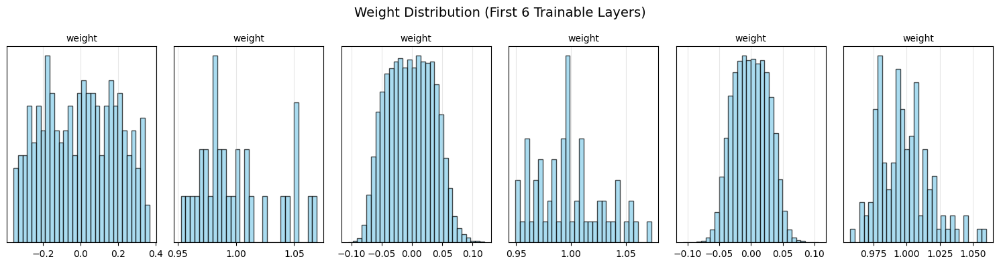

Starting validation on mps...
Validation Results:
 - Average Loss: 0.4760
 - Accuracy:     31.25% (5/16)
Epoch [23/50] Loss: 0.3902 | Val Acc: 31.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.8044
 - Accuracy:     18.75% (3/16)
Epoch [24/50] Loss: 0.3566 | Val Acc: 18.75%
Combined plot saved to checkpoints/training_dynamics_23.png


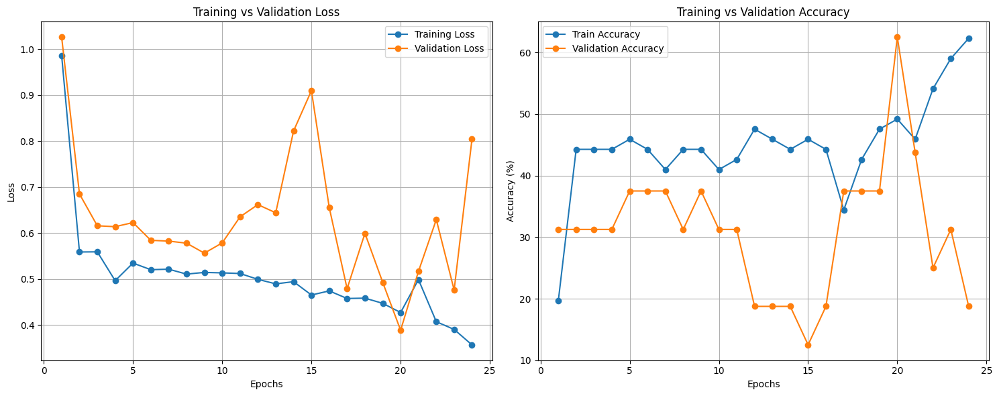

Layer gradient plot saved to checkpoints/layer_gradients_23.png


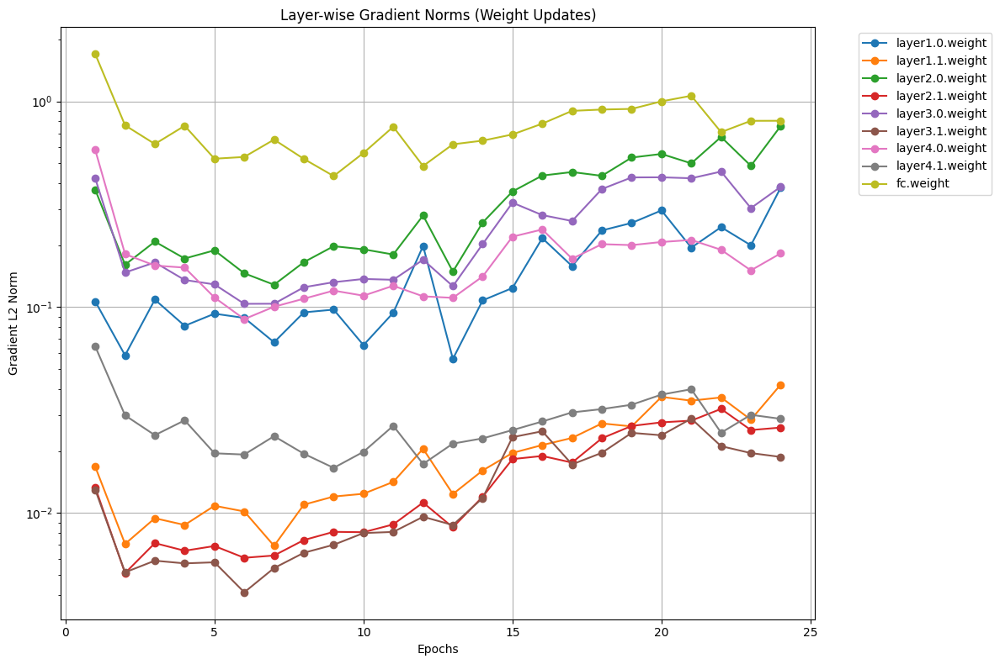


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3249          | OK
layer1.1.weight                | ✅ Yes      | 5.6609          | OK
layer2.0.weight                | ✅ Yes      | 5.1368          | OK
layer2.1.weight                | ✅ Yes      | 7.9848          | OK
layer3.0.weight                | ✅ Yes      | 7.5785          | OK
layer3.1.weight                | ✅ Yes      | 11.2733          | OK
layer4.0.weight                | ✅ Yes      | 11.3974          | OK
layer4.1.weight                | ✅ Yes      | 16.1148          | OK
fc.weight                      | ✅ Yes      | 2.0520          | OK
-------------------------------------------------------------------------------------


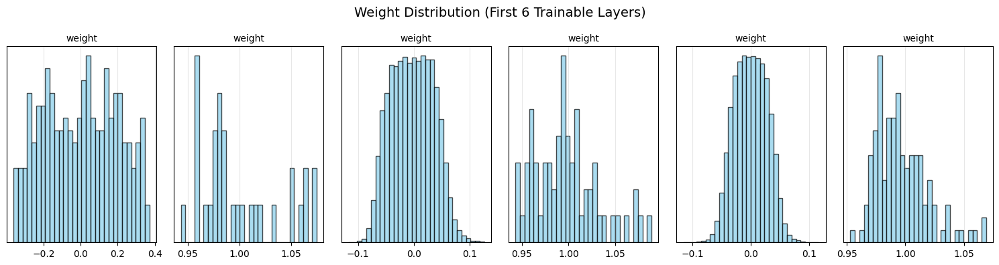

Starting validation on mps...
Validation Results:
 - Average Loss: 0.7229
 - Accuracy:     37.50% (6/16)
Epoch [25/50] Loss: 0.3255 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.5171
 - Accuracy:     43.75% (7/16)
Epoch [26/50] Loss: 0.3457 | Val Acc: 43.75%
Combined plot saved to checkpoints/training_dynamics_25.png


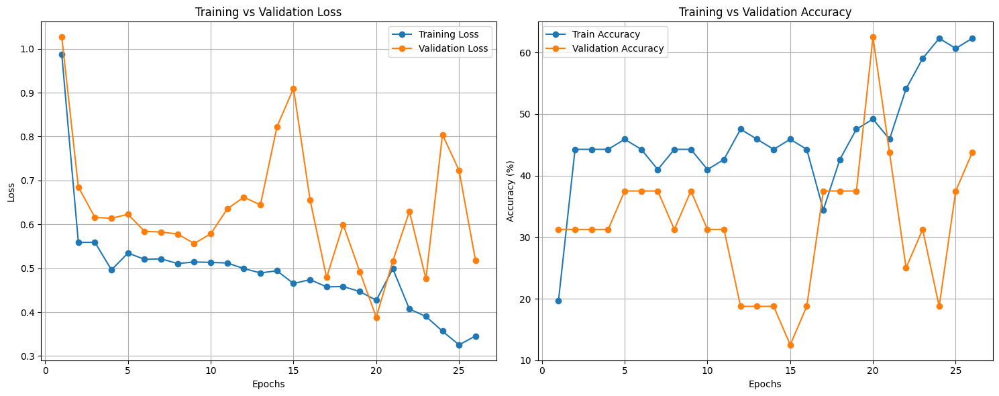

Layer gradient plot saved to checkpoints/layer_gradients_25.png


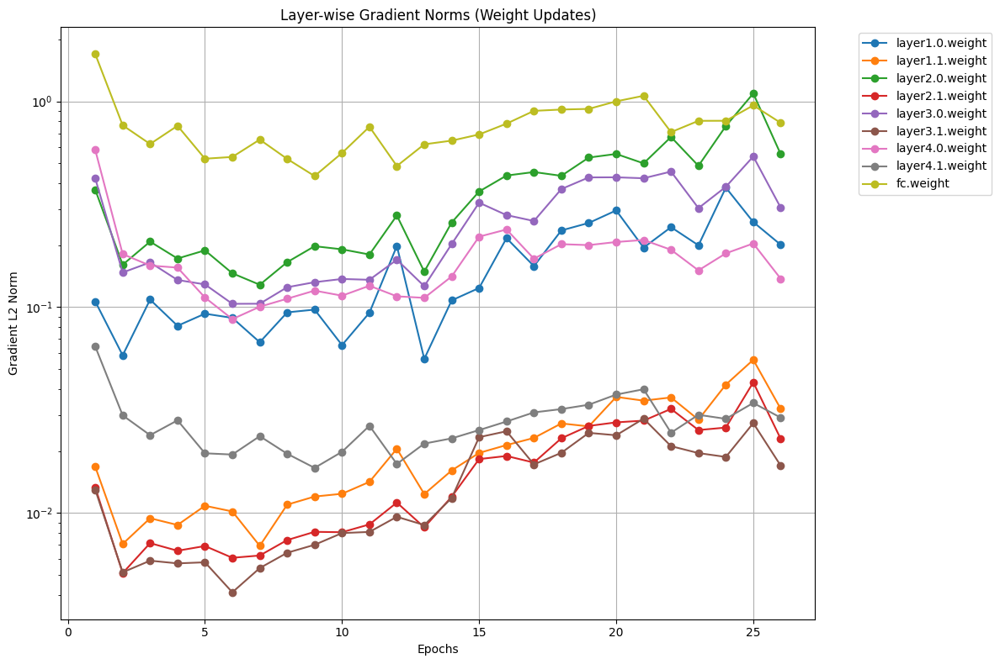


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3338          | OK
layer1.1.weight                | ✅ Yes      | 5.6608          | OK
layer2.0.weight                | ✅ Yes      | 5.1759          | OK
layer2.1.weight                | ✅ Yes      | 7.9801          | OK
layer3.0.weight                | ✅ Yes      | 7.6632          | OK
layer3.1.weight                | ✅ Yes      | 11.2598          | OK
layer4.0.weight                | ✅ Yes      | 11.6072          | OK
layer4.1.weight                | ✅ Yes      | 16.1438          | OK
fc.weight                      | ✅ Yes      | 2.0812          | OK
-------------------------------------------------------------------------------------


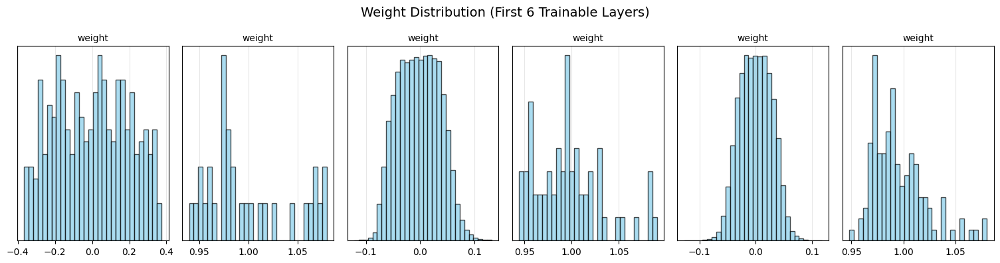

Starting validation on mps...
Validation Results:
 - Average Loss: 0.4757
 - Accuracy:     37.50% (6/16)
Epoch [27/50] Loss: 0.3348 | Val Acc: 37.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.5935
 - Accuracy:     31.25% (5/16)
Epoch [28/50] Loss: 0.3387 | Val Acc: 31.25%
Combined plot saved to checkpoints/training_dynamics_27.png


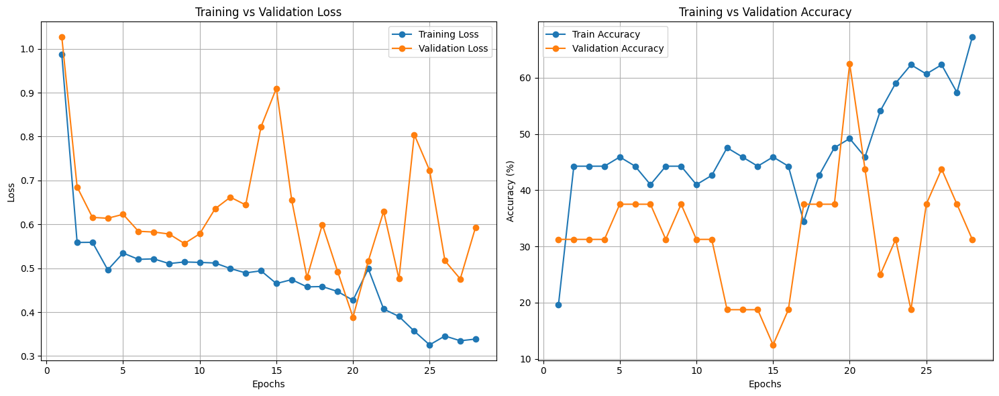

Layer gradient plot saved to checkpoints/layer_gradients_27.png


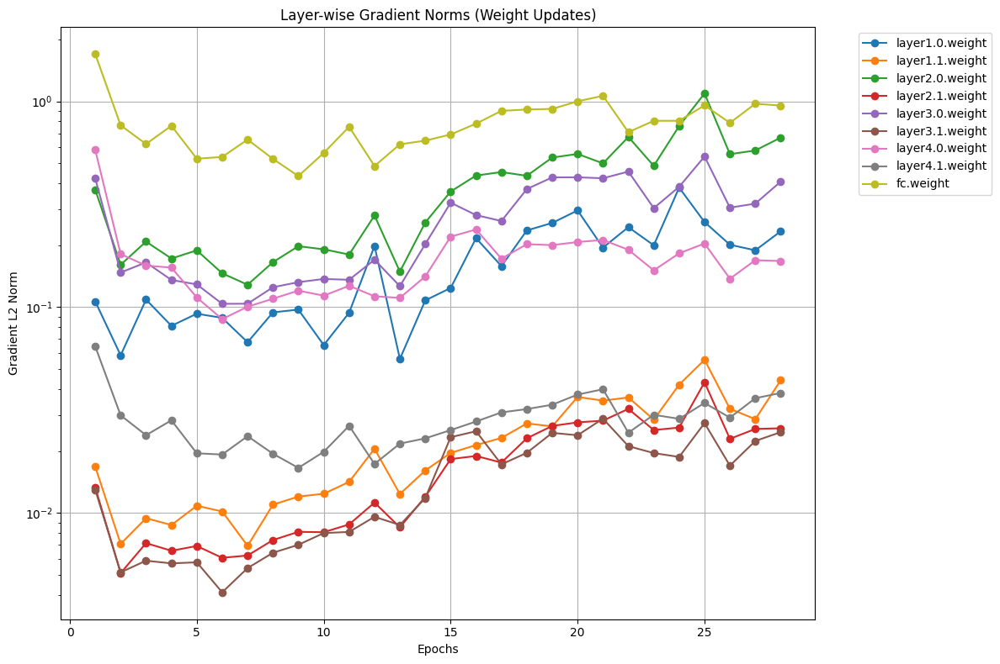


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3459          | OK
layer1.1.weight                | ✅ Yes      | 5.6576          | OK
layer2.0.weight                | ✅ Yes      | 5.2086          | OK
layer2.1.weight                | ✅ Yes      | 7.9729          | OK
layer3.0.weight                | ✅ Yes      | 7.7505          | OK
layer3.1.weight                | ✅ Yes      | 11.2524          | OK
layer4.0.weight                | ✅ Yes      | 11.7694          | OK
layer4.1.weight                | ✅ Yes      | 16.1629          | OK
fc.weight                      | ✅ Yes      | 2.1045          | OK
-------------------------------------------------------------------------------------


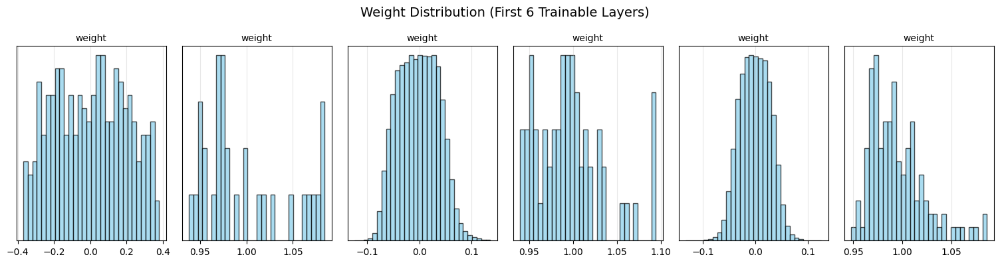

Starting validation on mps...
Validation Results:
 - Average Loss: 0.2750
 - Accuracy:     56.25% (9/16)
Epoch [29/50] Loss: 0.3105 | Val Acc: 56.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3295
 - Accuracy:     43.75% (7/16)
Epoch [30/50] Loss: 0.3247 | Val Acc: 43.75%
Combined plot saved to checkpoints/training_dynamics_29.png


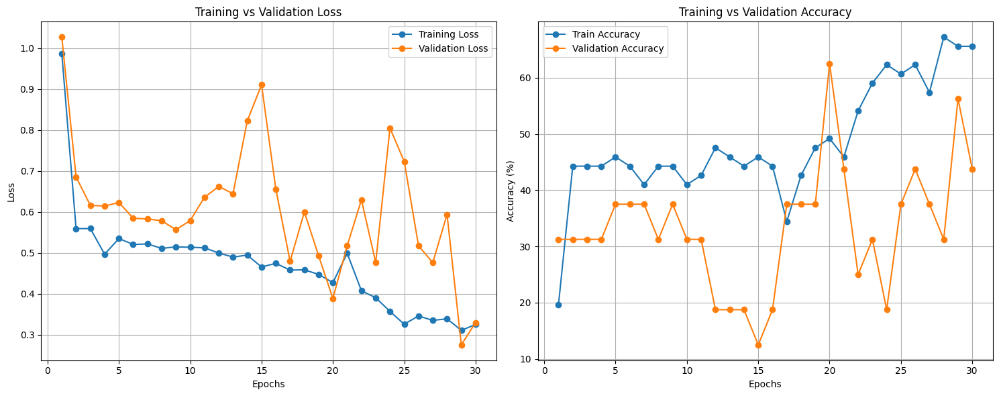

Layer gradient plot saved to checkpoints/layer_gradients_29.png


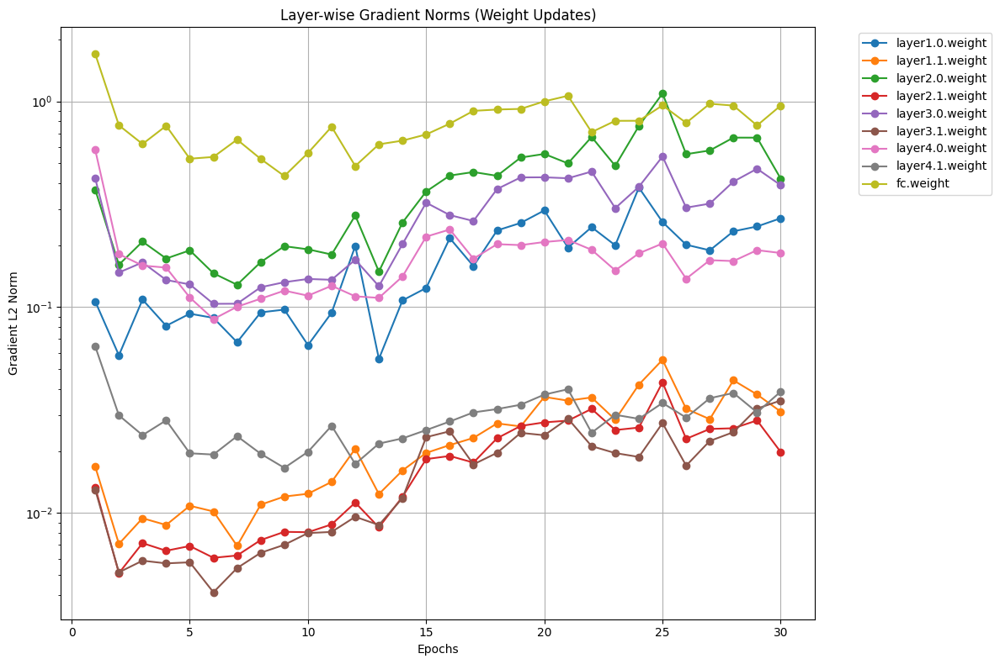


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3517          | OK
layer1.1.weight                | ✅ Yes      | 5.6557          | OK
layer2.0.weight                | ✅ Yes      | 5.2343          | OK
layer2.1.weight                | ✅ Yes      | 7.9681          | OK
layer3.0.weight                | ✅ Yes      | 7.8248          | OK
layer3.1.weight                | ✅ Yes      | 11.2443          | OK
layer4.0.weight                | ✅ Yes      | 11.9089          | OK
layer4.1.weight                | ✅ Yes      | 16.1953          | OK
fc.weight                      | ✅ Yes      | 2.1349          | OK
-------------------------------------------------------------------------------------


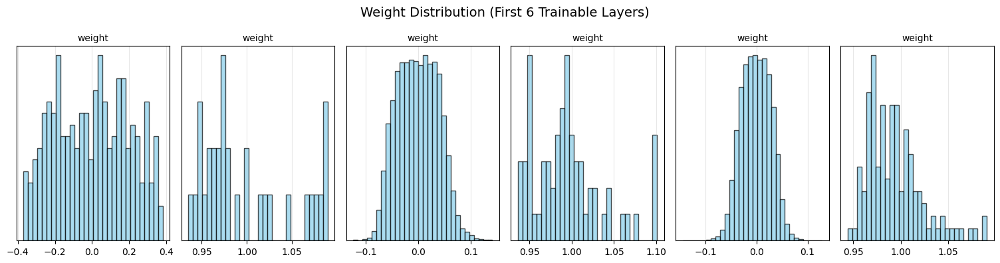

Starting validation on mps...
Validation Results:
 - Average Loss: 0.3364
 - Accuracy:     50.00% (8/16)
Epoch [31/50] Loss: 0.2427 | Val Acc: 50.00%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3177
 - Accuracy:     68.75% (11/16)
Epoch [32/50] Loss: 0.2773 | Val Acc: 68.75%
Combined plot saved to checkpoints/training_dynamics_31.png


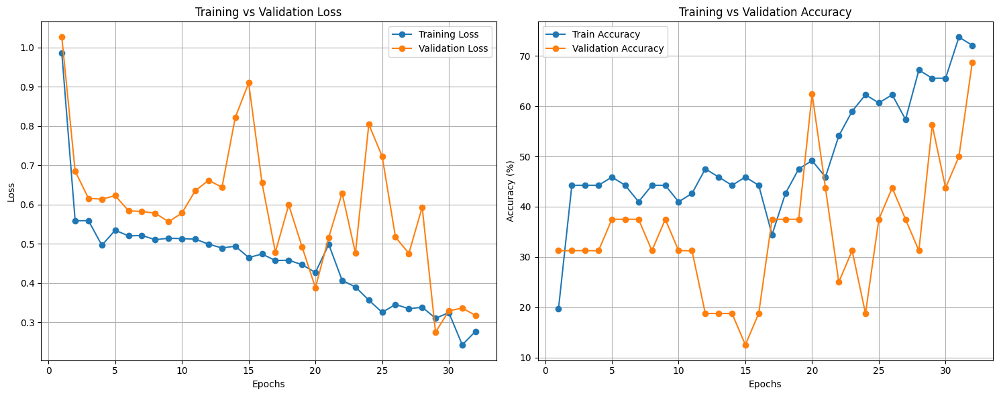

Layer gradient plot saved to checkpoints/layer_gradients_31.png


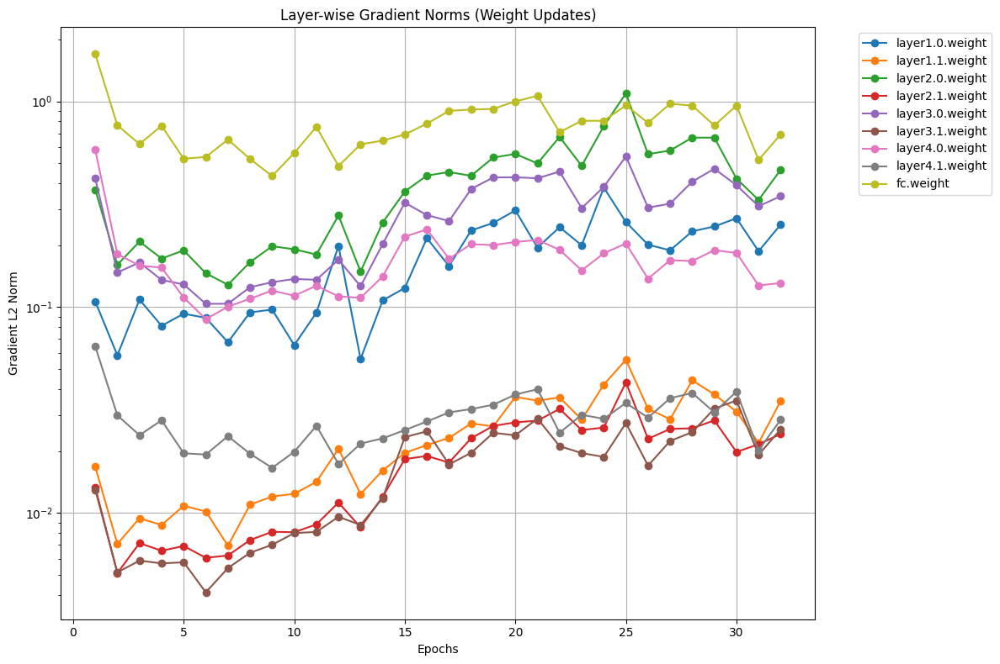


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3565          | OK
layer1.1.weight                | ✅ Yes      | 5.6536          | OK
layer2.0.weight                | ✅ Yes      | 5.2538          | OK
layer2.1.weight                | ✅ Yes      | 7.9629          | OK
layer3.0.weight                | ✅ Yes      | 7.8853          | OK
layer3.1.weight                | ✅ Yes      | 11.2337          | OK
layer4.0.weight                | ✅ Yes      | 12.0211          | OK
layer4.1.weight                | ✅ Yes      | 16.2311          | OK
fc.weight                      | ✅ Yes      | 2.1684          | OK
-------------------------------------------------------------------------------------


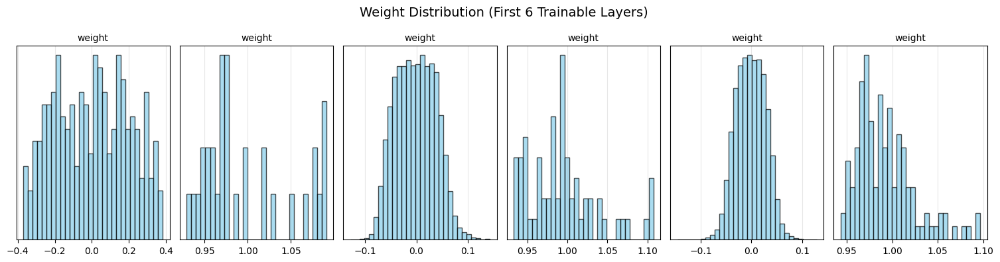

Starting validation on mps...
Validation Results:
 - Average Loss: 0.3548
 - Accuracy:     62.50% (10/16)
Epoch [33/50] Loss: 0.2667 | Val Acc: 62.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3340
 - Accuracy:     62.50% (10/16)
Epoch [34/50] Loss: 0.2566 | Val Acc: 62.50%
Combined plot saved to checkpoints/training_dynamics_33.png


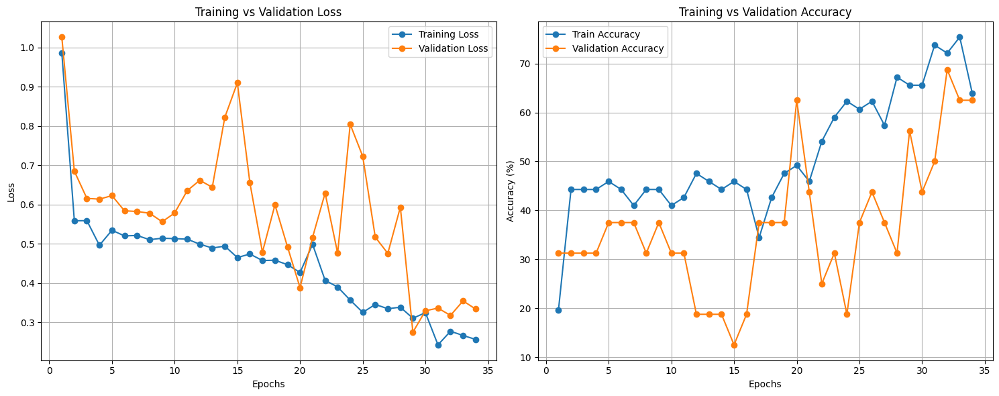

Layer gradient plot saved to checkpoints/layer_gradients_33.png


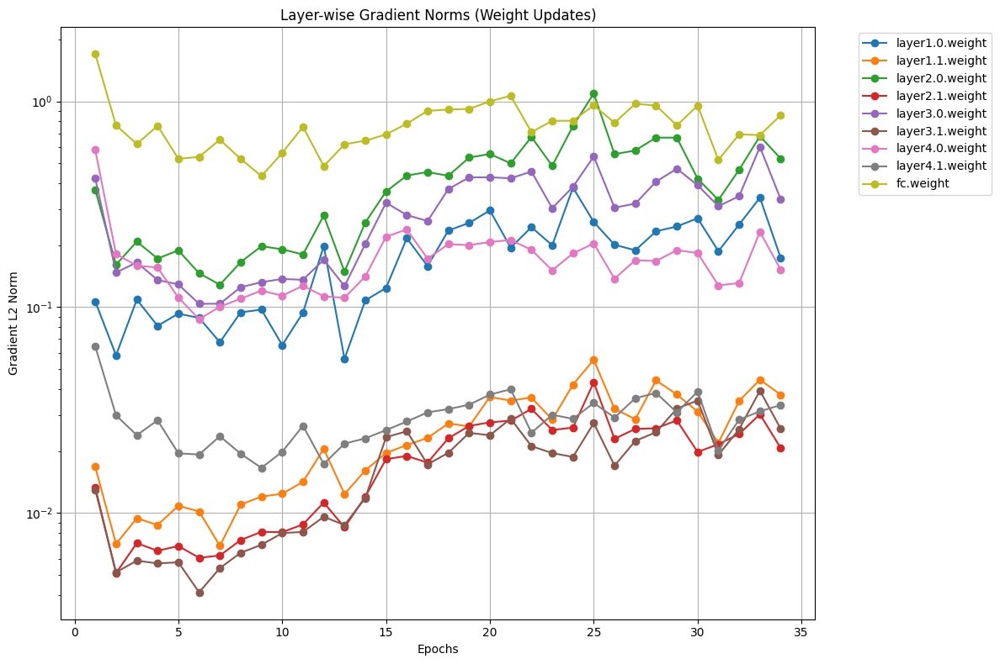


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3543          | OK
layer1.1.weight                | ✅ Yes      | 5.6528          | OK
layer2.0.weight                | ✅ Yes      | 5.2770          | OK
layer2.1.weight                | ✅ Yes      | 7.9582          | OK
layer3.0.weight                | ✅ Yes      | 7.9390          | OK
layer3.1.weight                | ✅ Yes      | 11.2280          | OK
layer4.0.weight                | ✅ Yes      | 12.1403          | OK
layer4.1.weight                | ✅ Yes      | 16.2666          | OK
fc.weight                      | ✅ Yes      | 2.2008          | OK
-------------------------------------------------------------------------------------


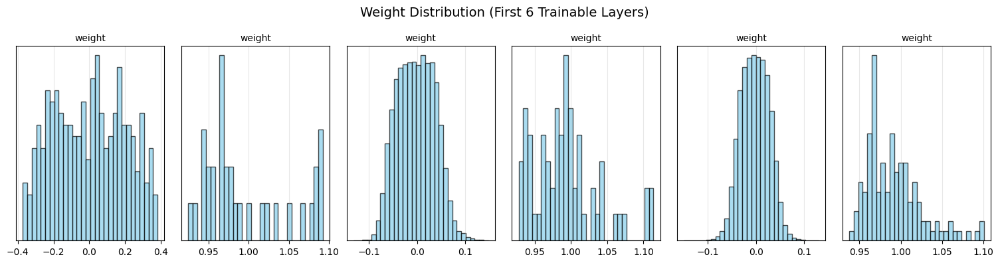

Starting validation on mps...
Validation Results:
 - Average Loss: 0.3832
 - Accuracy:     62.50% (10/16)
Epoch [35/50] Loss: 0.2357 | Val Acc: 62.50%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.2473
 - Accuracy:     81.25% (13/16)
Epoch [36/50] Loss: 0.2363 | Val Acc: 81.25%
Combined plot saved to checkpoints/training_dynamics_35.png


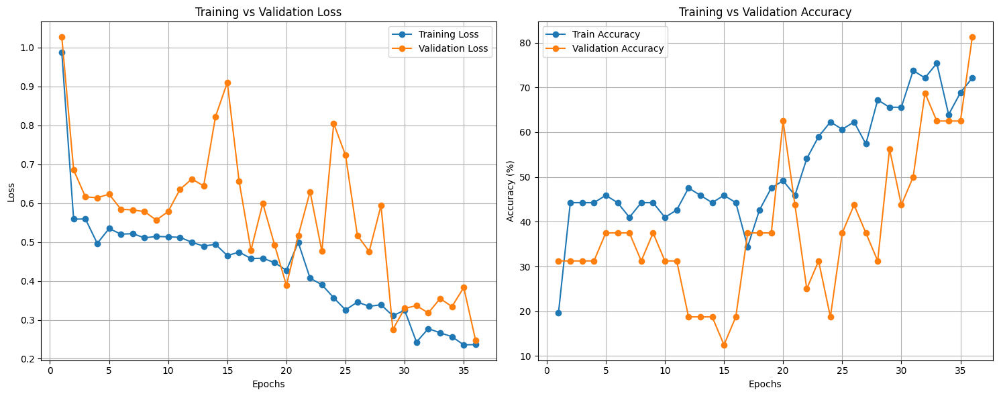

Layer gradient plot saved to checkpoints/layer_gradients_35.png


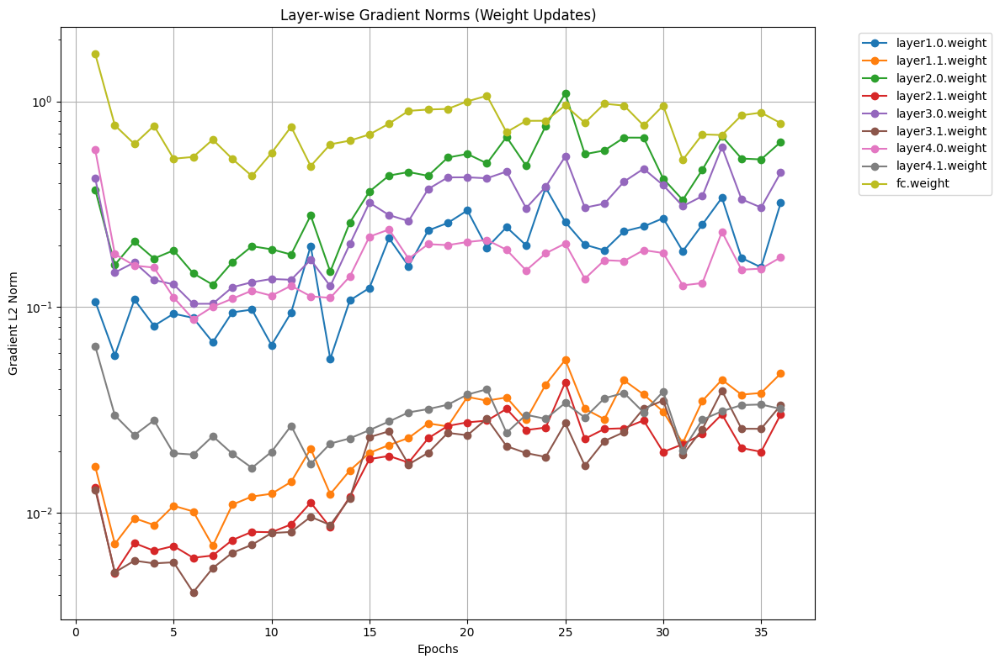


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3555          | OK
layer1.1.weight                | ✅ Yes      | 5.6511          | OK
layer2.0.weight                | ✅ Yes      | 5.3060          | OK
layer2.1.weight                | ✅ Yes      | 7.9567          | OK
layer3.0.weight                | ✅ Yes      | 7.9881          | OK
layer3.1.weight                | ✅ Yes      | 11.2237          | OK
layer4.0.weight                | ✅ Yes      | 12.2672          | OK
layer4.1.weight                | ✅ Yes      | 16.3007          | OK
fc.weight                      | ✅ Yes      | 2.2356          | OK
-------------------------------------------------------------------------------------


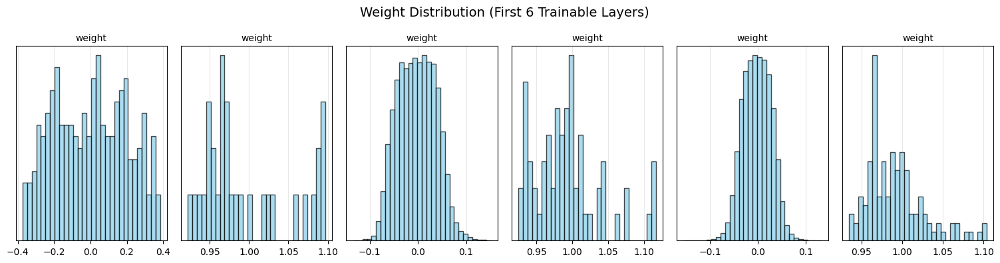

Starting validation on mps...
Validation Results:
 - Average Loss: 0.2879
 - Accuracy:     50.00% (8/16)
Epoch [37/50] Loss: 0.2842 | Val Acc: 50.00%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.2931
 - Accuracy:     75.00% (12/16)
Epoch [38/50] Loss: 0.2834 | Val Acc: 75.00%
Combined plot saved to checkpoints/training_dynamics_37.png


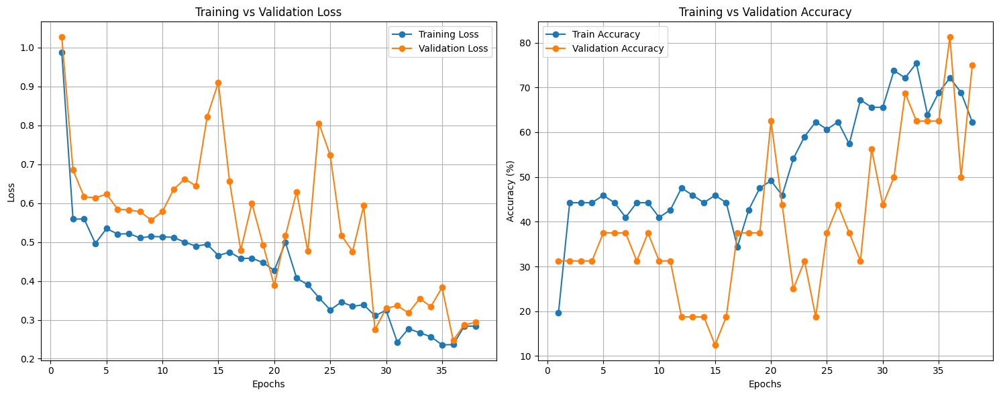

Layer gradient plot saved to checkpoints/layer_gradients_37.png


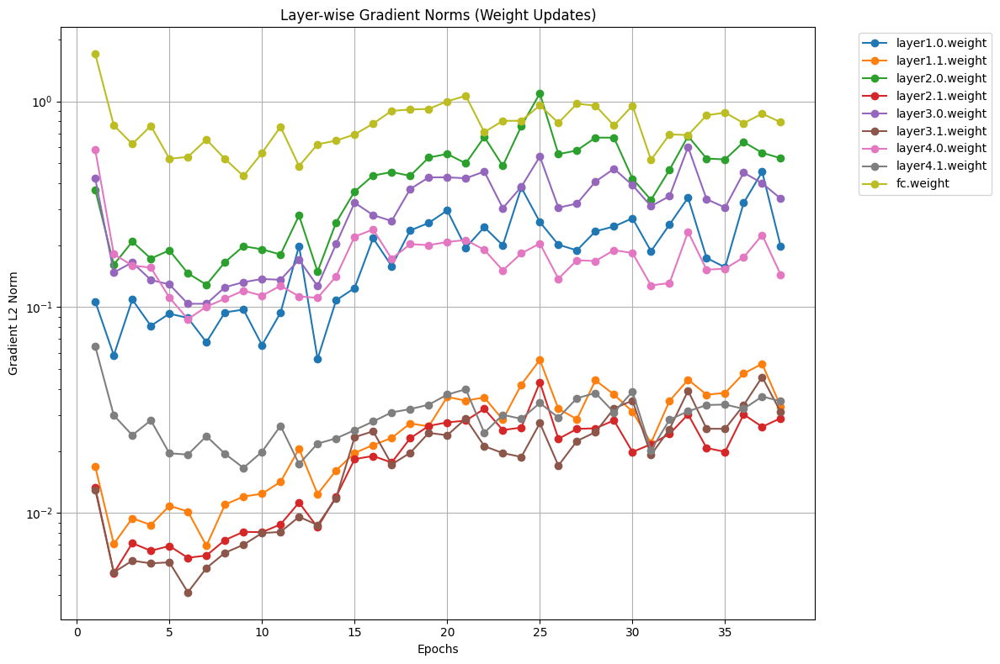


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3768          | OK
layer1.1.weight                | ✅ Yes      | 5.6497          | OK
layer2.0.weight                | ✅ Yes      | 5.3238          | OK
layer2.1.weight                | ✅ Yes      | 7.9522          | OK
layer3.0.weight                | ✅ Yes      | 8.0501          | OK
layer3.1.weight                | ✅ Yes      | 11.2213          | OK
layer4.0.weight                | ✅ Yes      | 12.4361          | OK
layer4.1.weight                | ✅ Yes      | 16.3251          | OK
fc.weight                      | ✅ Yes      | 2.2655          | OK
-------------------------------------------------------------------------------------


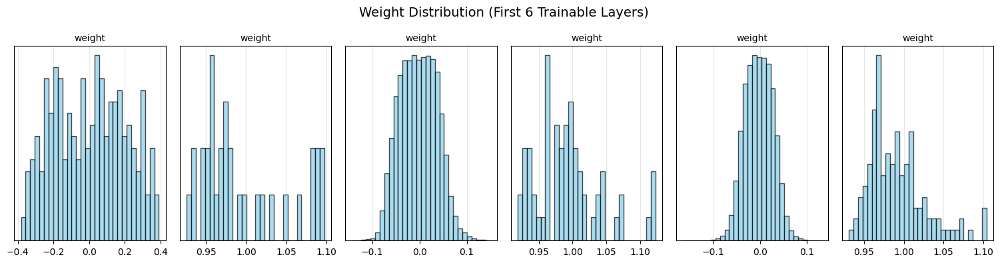

Starting validation on mps...
Validation Results:
 - Average Loss: 0.5124
 - Accuracy:     50.00% (8/16)
Epoch [39/50] Loss: 0.2730 | Val Acc: 50.00%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.2320
 - Accuracy:     75.00% (12/16)
Epoch [40/50] Loss: 0.2018 | Val Acc: 75.00%
Combined plot saved to checkpoints/training_dynamics_39.png


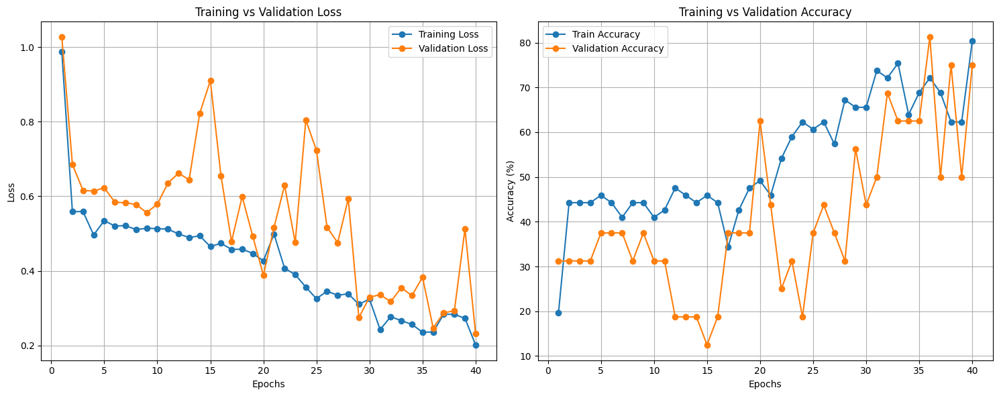

Layer gradient plot saved to checkpoints/layer_gradients_39.png


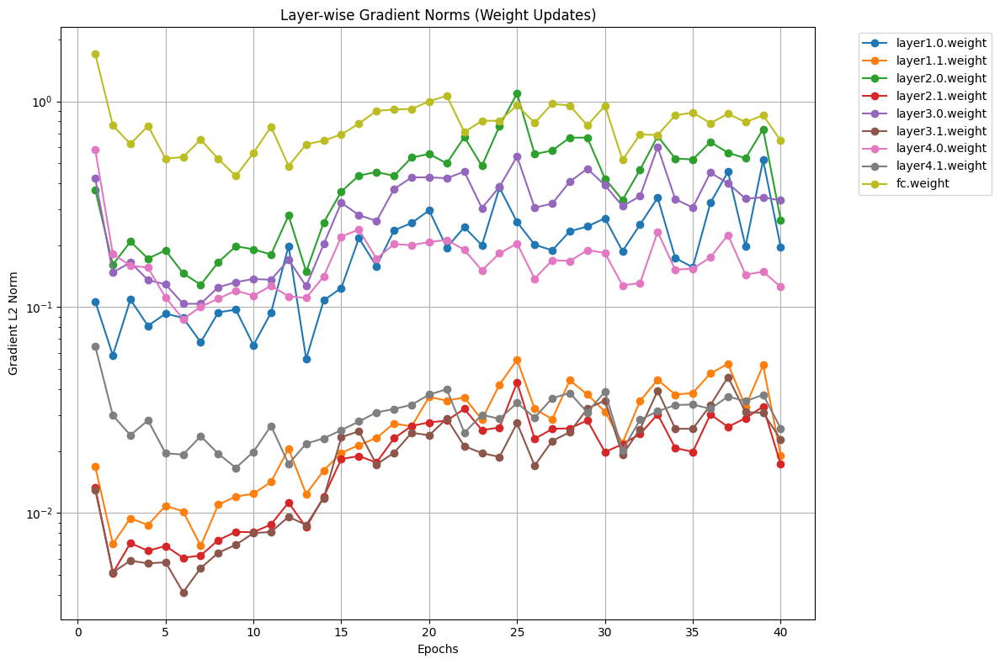


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3819          | OK
layer1.1.weight                | ✅ Yes      | 5.6459          | OK
layer2.0.weight                | ✅ Yes      | 5.3759          | OK
layer2.1.weight                | ✅ Yes      | 7.9516          | OK
layer3.0.weight                | ✅ Yes      | 8.1192          | OK
layer3.1.weight                | ✅ Yes      | 11.2177          | OK
layer4.0.weight                | ✅ Yes      | 12.5748          | OK
layer4.1.weight                | ✅ Yes      | 16.3603          | OK
fc.weight                      | ✅ Yes      | 2.3056          | OK
-------------------------------------------------------------------------------------


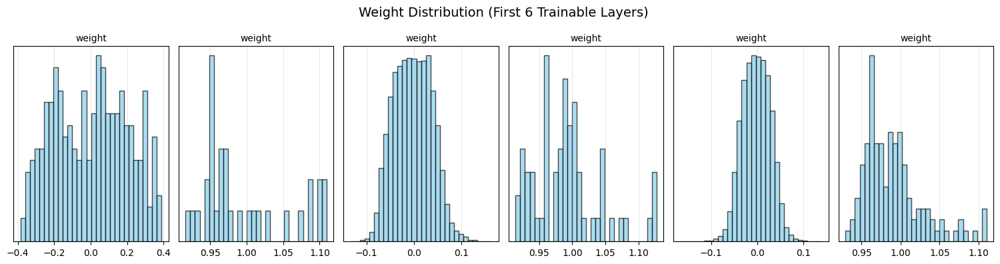

Starting validation on mps...
Validation Results:
 - Average Loss: 0.2219
 - Accuracy:     81.25% (13/16)
Epoch [41/50] Loss: 0.2636 | Val Acc: 81.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3289
 - Accuracy:     68.75% (11/16)
Epoch [42/50] Loss: 0.1911 | Val Acc: 68.75%
Combined plot saved to checkpoints/training_dynamics_41.png


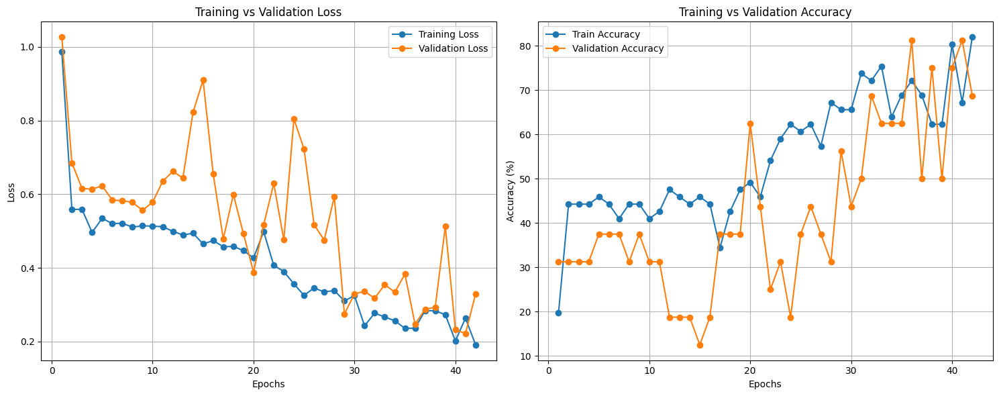

Layer gradient plot saved to checkpoints/layer_gradients_41.png


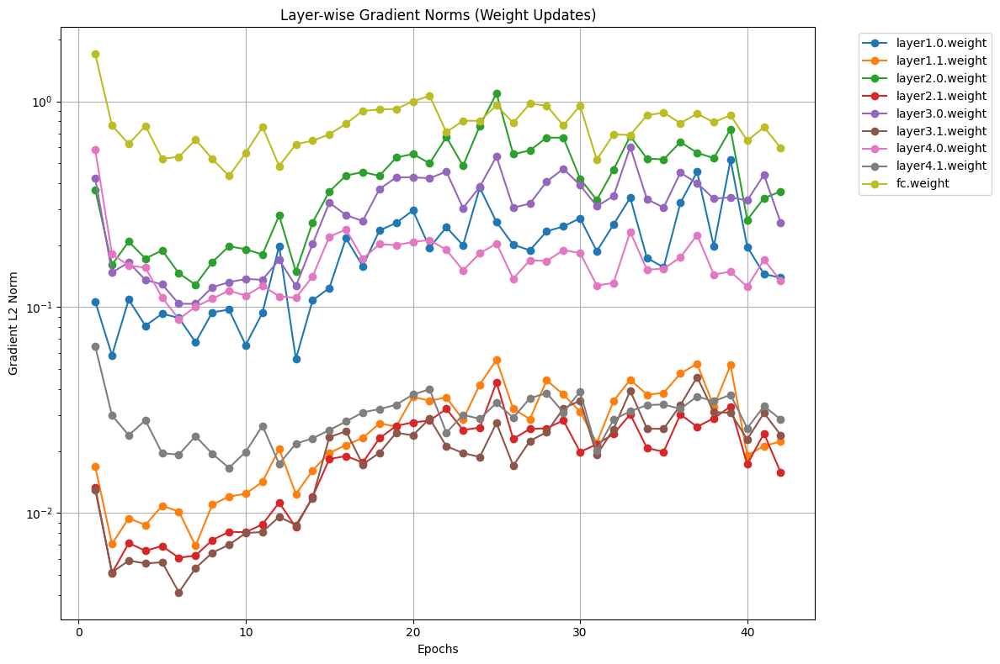


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3831          | OK
layer1.1.weight                | ✅ Yes      | 5.6446          | OK
layer2.0.weight                | ✅ Yes      | 5.4026          | OK
layer2.1.weight                | ✅ Yes      | 7.9454          | OK
layer3.0.weight                | ✅ Yes      | 8.1676          | OK
layer3.1.weight                | ✅ Yes      | 11.2129          | OK
layer4.0.weight                | ✅ Yes      | 12.6952          | OK
layer4.1.weight                | ✅ Yes      | 16.3895          | OK
fc.weight                      | ✅ Yes      | 2.3340          | OK
-------------------------------------------------------------------------------------


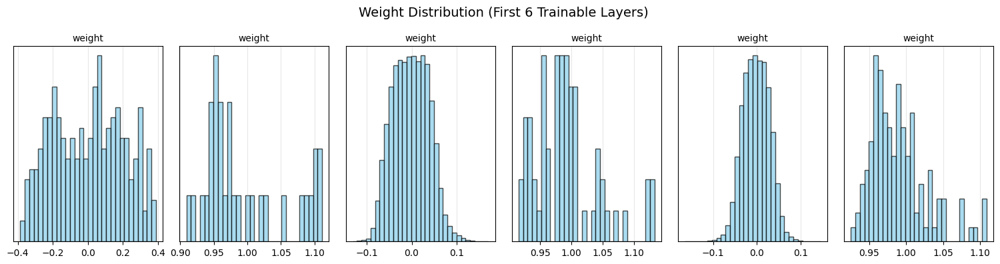

Starting validation on mps...
Validation Results:
 - Average Loss: 0.3040
 - Accuracy:     68.75% (11/16)
Epoch [43/50] Loss: 0.2237 | Val Acc: 68.75%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.2315
 - Accuracy:     56.25% (9/16)
Epoch [44/50] Loss: 0.2321 | Val Acc: 56.25%
Combined plot saved to checkpoints/training_dynamics_43.png


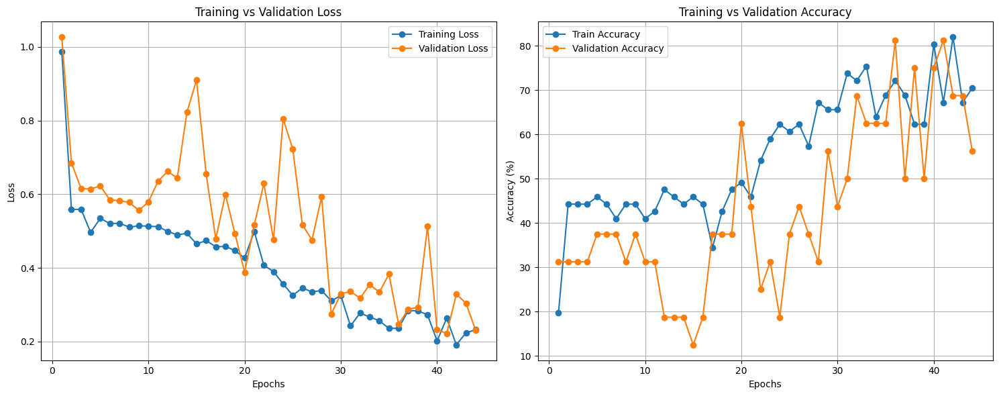

Layer gradient plot saved to checkpoints/layer_gradients_43.png


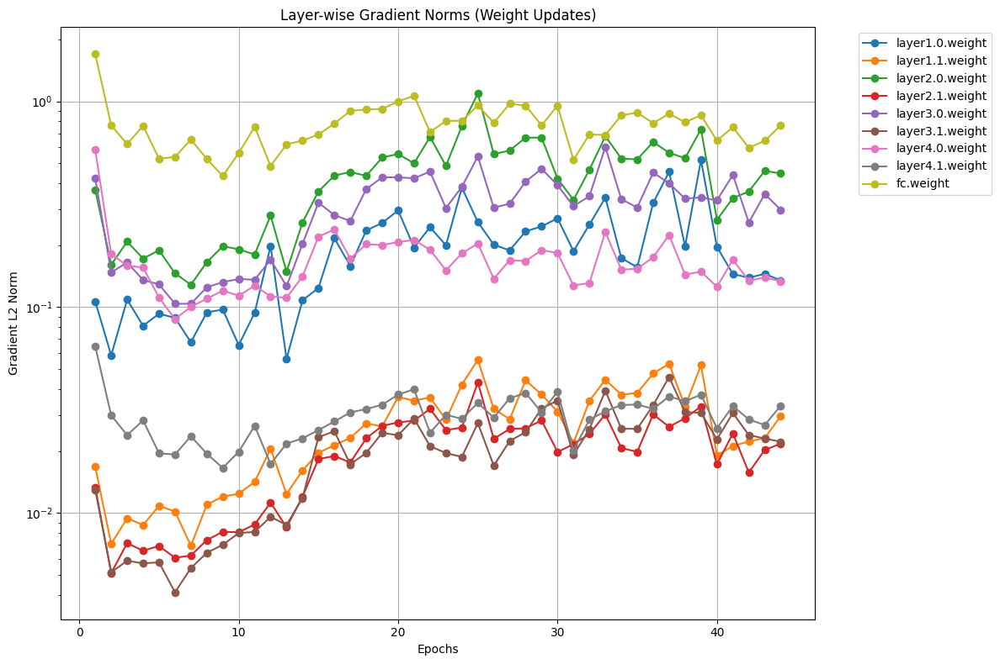


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3901          | OK
layer1.1.weight                | ✅ Yes      | 5.6420          | OK
layer2.0.weight                | ✅ Yes      | 5.4225          | OK
layer2.1.weight                | ✅ Yes      | 7.9431          | OK
layer3.0.weight                | ✅ Yes      | 8.2120          | OK
layer3.1.weight                | ✅ Yes      | 11.2097          | OK
layer4.0.weight                | ✅ Yes      | 12.8167          | OK
layer4.1.weight                | ✅ Yes      | 16.4172          | OK
fc.weight                      | ✅ Yes      | 2.3622          | OK
-------------------------------------------------------------------------------------


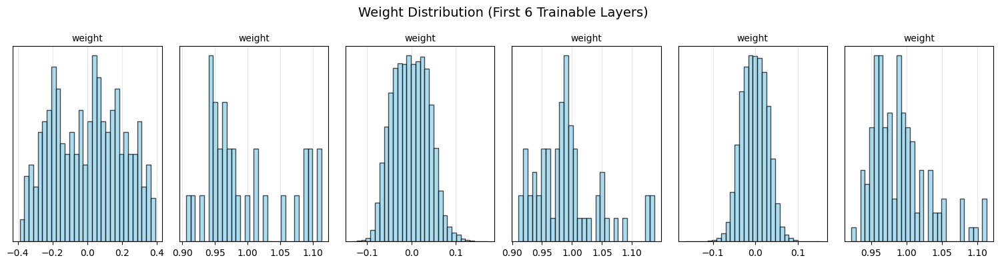

Starting validation on mps...
Validation Results:
 - Average Loss: 0.2457
 - Accuracy:     56.25% (9/16)
Epoch [45/50] Loss: 0.2285 | Val Acc: 56.25%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.2677
 - Accuracy:     62.50% (10/16)
Epoch [46/50] Loss: 0.2228 | Val Acc: 62.50%
Combined plot saved to checkpoints/training_dynamics_45.png


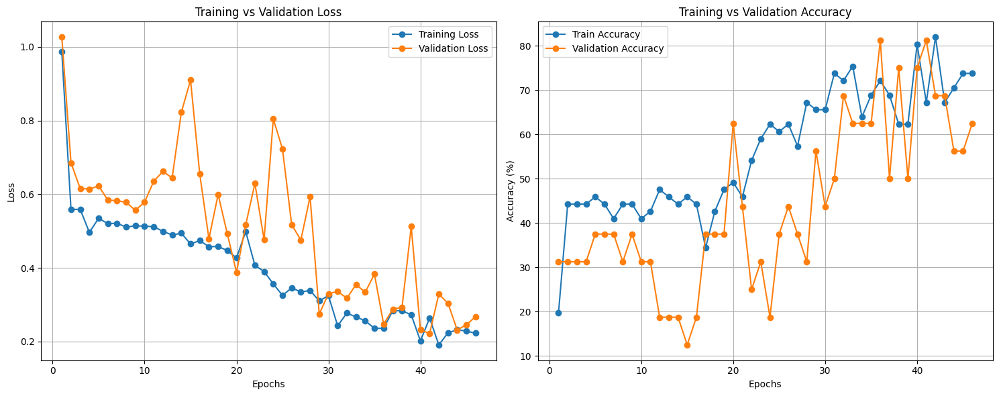

Layer gradient plot saved to checkpoints/layer_gradients_45.png


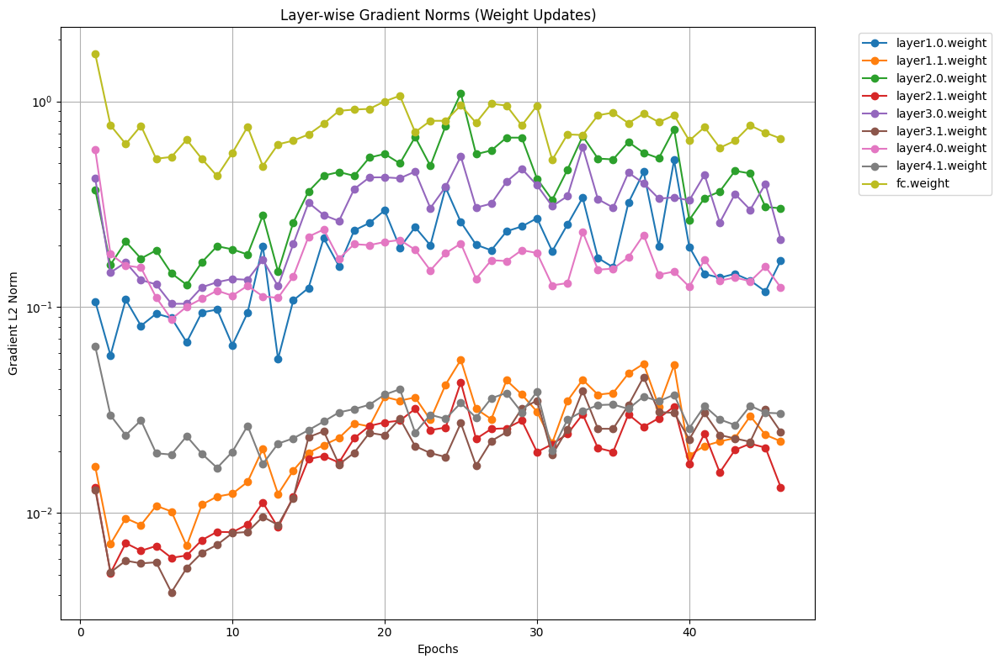


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3938          | OK
layer1.1.weight                | ✅ Yes      | 5.6396          | OK
layer2.0.weight                | ✅ Yes      | 5.4399          | OK
layer2.1.weight                | ✅ Yes      | 7.9404          | OK
layer3.0.weight                | ✅ Yes      | 8.2547          | OK
layer3.1.weight                | ✅ Yes      | 11.2070          | OK
layer4.0.weight                | ✅ Yes      | 12.9181          | OK
layer4.1.weight                | ✅ Yes      | 16.4449          | OK
fc.weight                      | ✅ Yes      | 2.3889          | OK
-------------------------------------------------------------------------------------


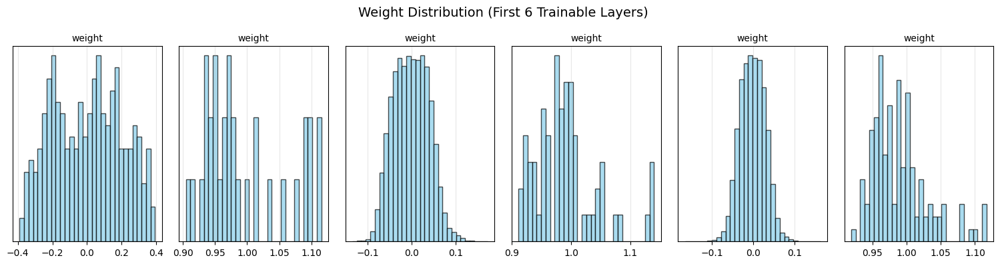

Starting validation on mps...
Validation Results:
 - Average Loss: 0.2633
 - Accuracy:     68.75% (11/16)
Epoch [47/50] Loss: 0.2205 | Val Acc: 68.75%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3094
 - Accuracy:     68.75% (11/16)
Epoch [48/50] Loss: 0.2256 | Val Acc: 68.75%
Combined plot saved to checkpoints/training_dynamics_47.png


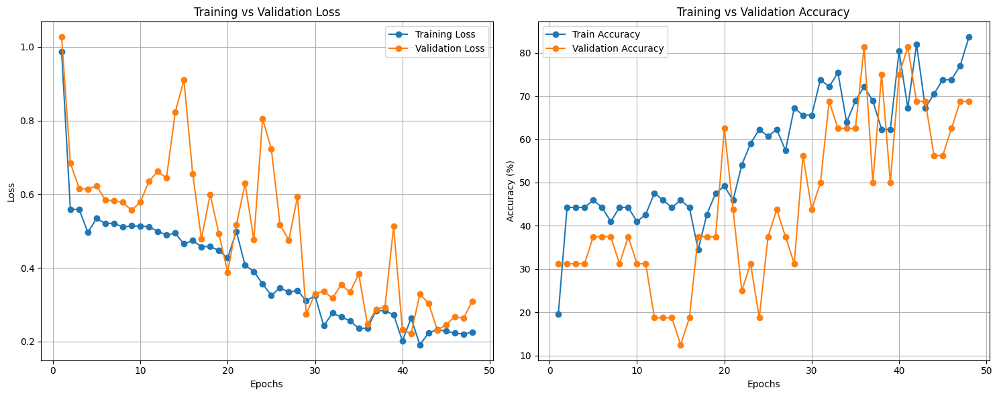

Layer gradient plot saved to checkpoints/layer_gradients_47.png


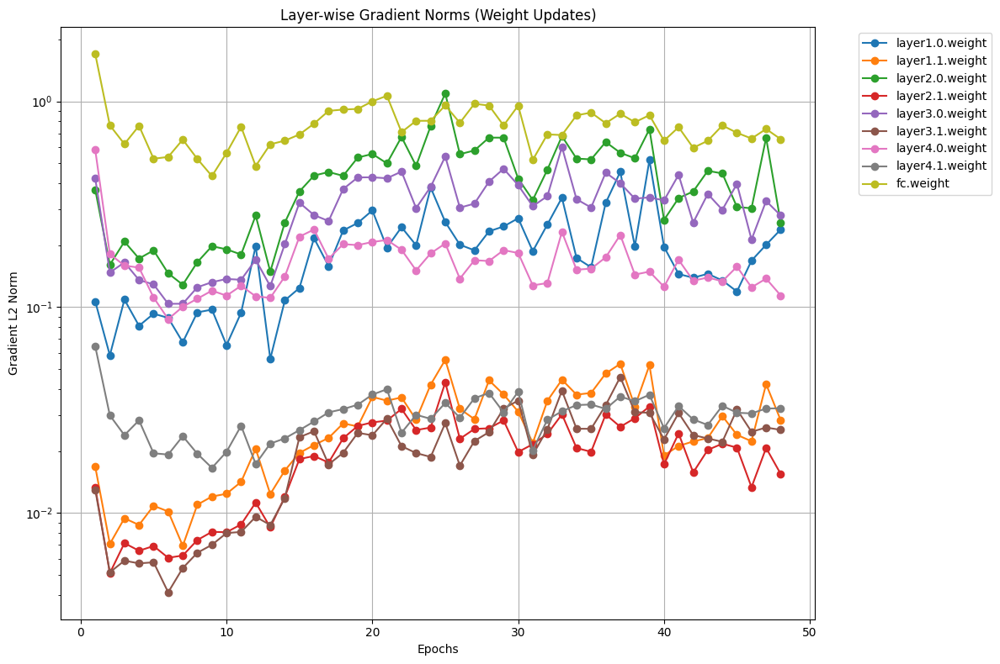


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3960          | OK
layer1.1.weight                | ✅ Yes      | 5.6394          | OK
layer2.0.weight                | ✅ Yes      | 5.4571          | OK
layer2.1.weight                | ✅ Yes      | 7.9392          | OK
layer3.0.weight                | ✅ Yes      | 8.2795          | OK
layer3.1.weight                | ✅ Yes      | 11.2037          | OK
layer4.0.weight                | ✅ Yes      | 12.9899          | OK
layer4.1.weight                | ✅ Yes      | 16.4709          | OK
fc.weight                      | ✅ Yes      | 2.4102          | OK
-------------------------------------------------------------------------------------


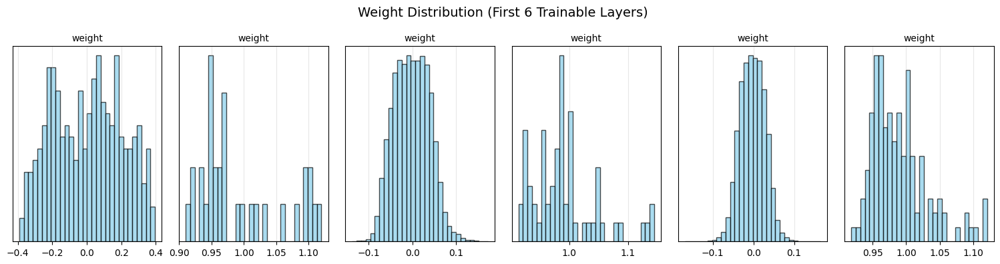

Starting validation on mps...
Validation Results:
 - Average Loss: 0.2102
 - Accuracy:     68.75% (11/16)
Epoch [49/50] Loss: 0.2204 | Val Acc: 68.75%
Starting validation on mps...
Validation Results:
 - Average Loss: 0.3076
 - Accuracy:     68.75% (11/16)
Epoch [50/50] Loss: 0.2249 | Val Acc: 68.75%
Combined plot saved to checkpoints/training_dynamics_49.png


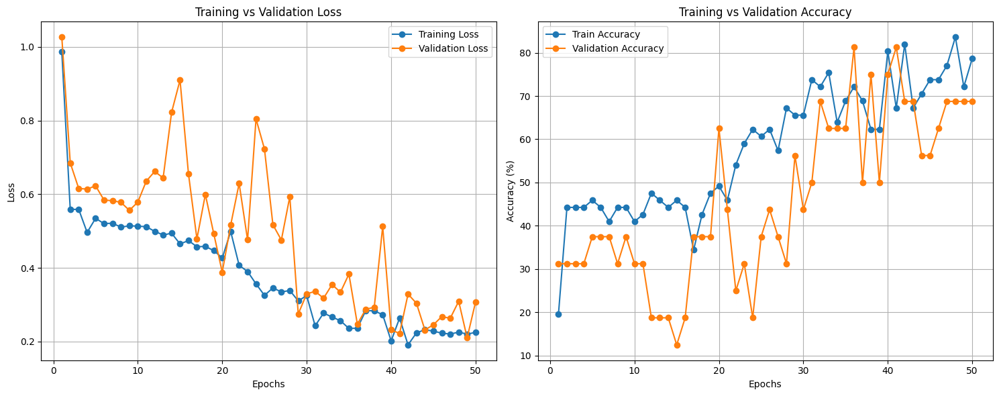

Layer gradient plot saved to checkpoints/layer_gradients_49.png


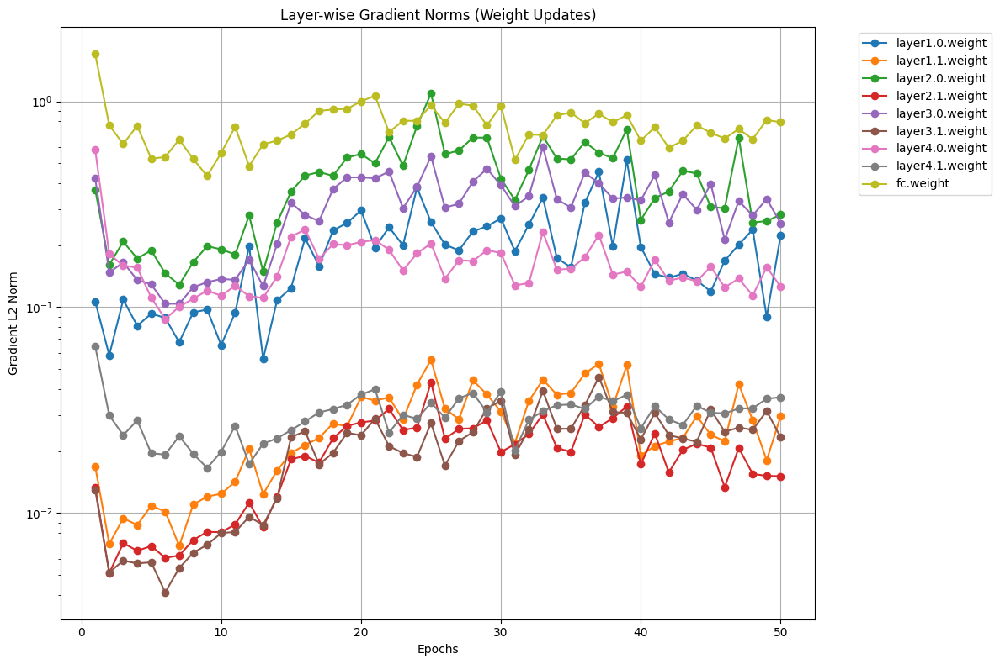


--- 🩺 Model Internals Diagnosis ---
Layer Name                     | Trainable? | Weight L2 Norm  | Status
-------------------------------------------------------------------------------------
layer1.0.weight                | ✅ Yes      | 3.3947          | OK
layer1.1.weight                | ✅ Yes      | 5.6384          | OK
layer2.0.weight                | ✅ Yes      | 5.4748          | OK
layer2.1.weight                | ✅ Yes      | 7.9371          | OK
layer3.0.weight                | ✅ Yes      | 8.3001          | OK
layer3.1.weight                | ✅ Yes      | 11.2018          | OK
layer4.0.weight                | ✅ Yes      | 13.0913          | OK
layer4.1.weight                | ✅ Yes      | 16.4989          | OK
fc.weight                      | ✅ Yes      | 2.4383          | OK
-------------------------------------------------------------------------------------


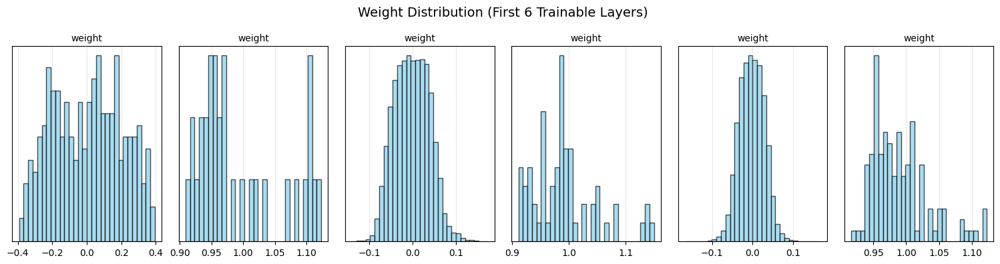

In [11]:
init_model = RepetitionCounterNet()

model, history = train_repetition_model(
    model=init_model, 
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=NUM_EPOCHS, 
    lr=0.001
)

In [12]:
def evaluate(model, test_loader, dataset, device):
    
    model.eval()
    correct = 0
    total = 0

    all_preds = []
    all_labels = []
    all_times = []

    print("\n")

    with torch.no_grad():
        for idx, (frames, labels) in enumerate(test_loader):
            frames, labels = frames.to(device), labels.to(device)

            # Time the forward pass
            start_time = time.time()
            outputs = model(frames)
            if device.type == 'cuda':
                torch.cuda.synchronize()  # wait for GPU to finish
            end_time = time.time()

            inference_time = (end_time - start_time) * 1000  # ms
            all_times.append(inference_time)

            preds = outputs.argmax(dim=1)

            for i in range(labels.size(0)):
                batch_idx = idx * test_loader.batch_size + i
                video_name = dataset.video_files[batch_idx]
                pred = preds[i].item()
                true_label = labels[i].item()
                is_correct = "✓" if pred == true_label else "✗"

                print(f"{is_correct}  pred={pred}  true={true_label}  |  {inference_time:>7.1f}ms  |  {video_name}")

            correct += preds.eq(labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = correct / total
    return accuracy, all_preds, all_labels, all_times


# =============================================================================
# RUN INFERENCE
# =============================================================================

def run_inference(model):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    model = model.to(device)

    # Create dataloader
    all_files = [f for f in os.listdir(VIDEOS_DIR_PATH) if f.endswith(VIDEO_EXTENSIONS)]
    test_dataset = SimilarityMatrixDataset(
        video_dir=VIDEOS_DIR_PATH,
        file_list=all_files,
        transform=None,
        matrix_size=MATRIX_SIZE
    )
    # test_dataset = VideoDataset(test_dir, frame_size=(224, 224))

    test_loader = DataLoader(test_dataset,
                             batch_size=1,
                             shuffle=False)
    # test_loader = DataLoader(
    #     test_dataset,
    #     batch_size=1,
    #     shuffle=False,
    #     num_workers=0,
    #     collate_fn=collate_fn
    # )

    print(f"\nRunning inference on {len(test_dataset)} test videos...")

    # # Warmup (optional, helps get consistent GPU timings)
    # input_shape = (1, 1, 128, 128)
    # if device.type == 'cuda':
    #     dummy = torch.randn(*input_shape).to(device)
    #     with torch.no_grad():
    #         _ = model(dummy)
    #     torch.cuda.synchronize()

    total_start = time.time()
    accuracy, preds, labels, times = evaluate(model, test_loader, test_dataset, device)
    total_end = time.time()

    # Summary
    num_correct = sum(p == l for p, l in zip(preds, labels))
    num_wrong = len(preds) - num_correct

    print("\n" + "="*50)
    print("SUMMARY")
    print("="*50)
    print(f"Total videos:         {len(preds)}")
    print(f"Correct:              {num_correct}")
    print(f"Incorrect:                {num_wrong}")
    print(f"")
    print(f"ACCURACY:             {accuracy*100:.2f}%")
    print(f"")
    print(f"Total time:           {total_end - total_start:.2f}s")
    print(f"Avg per video:        {sum(times) / len(times):.1f}ms")
    print(f"Min latency:          {min(times):.1f}ms")
    print(f"Max latency:          {max(times):.1f}ms")
    print("="*50)
    return accuracy, preds, labels

_, _, _ = run_inference(model)

Using device: cpu

Running inference on 77 test videos...


✓  pred=1  true=1  |      2.1ms  |  2_sadfasjldkfjaseifj.mp4
✓  pred=1  true=1  |      1.7ms  |  2_sdafkjaslkclaksdjkas.mp4
✓  pred=3  true=3  |      1.7ms  |  4_kling_20251206_Text_to_Video_Generate_a_28_0.mp4
✓  pred=2  true=2  |      1.8ms  |  3_kling_dskfseu.mp4
✓  pred=3  true=3  |      1.7ms  |  4_kling_20251209_Text_to_Video_Generate_a_190_0.mp4
✓  pred=2  true=2  |      1.8ms  |  3_kling_kdjflaskdjf.mp4
✓  pred=1  true=1  |      1.8ms  |  2_dsalkfjalwkenlke.mp4
✗  pred=1  true=2  |      1.7ms  |  3_dsjlaeijlksjdfie.mp4
✓  pred=2  true=2  |      1.9ms  |  3_kling_20251205_Text_to_Video_On_a_playg_5028_0.mp4
✓  pred=3  true=3  |      2.0ms  |  4_sadlfkjlknewkjejk.mp4
✓  pred=2  true=2  |      2.0ms  |  3_kling_20251206_Text_to_Video_Generate_a_315_2.mp4
✓  pred=3  true=3  |      1.9ms  |  4_kling_20251209_Text_to_Video_Generate_a_561_1.mp4
✓  pred=1  true=1  |      1.8ms  |  2_difficult_2.mp4
✗  pred=1  true=2  |      1.

In [13]:
def predict_video_count(video_path, model, device, matrix_size=(128, 128)):
    """
    Takes a raw video path and returns the predicted repetition count.
    """
    # --- 1. Generate Similarity Matrix from Video ---
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open {video_path}")
        return None

    frames_flat = []
    calc_dim = (64, 64) # Small size for fast cosine calc

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # Process frame: Gray -> Resize -> Flatten
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        resized = cv2.resize(gray, calc_dim)
        frames_flat.append(resized.flatten())

    cap.release()

    if len(frames_flat) == 0:
        print("Error: Video has no frames.")
        return None

    # Calculate Cosine Similarity (The "Heatmap")
    video_matrix = np.array(frames_flat)
    sim_matrix = cosine_similarity(video_matrix)

    # --- 2. Preprocess for Model ---
    # Resize to the input size the model expects (128x128)
    final_matrix = cv2.resize(sim_matrix, (matrix_size[1], matrix_size[0]))
    
    # Convert to Tensor
    # Add Channel dim (1) and Batch dim (1) -> Shape: (1, 1, 128, 128)
    input_tensor = torch.tensor(final_matrix, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
    
    # Move to GPU/MPS
    input_tensor = input_tensor.to(device)

    # --- 3. Predict ---
    model = model.to(device)
    model.eval() # Set model to evaluation mode
    
    with torch.no_grad():
        prediction = model(input_tensor)
        
        # Get class with highest score
        predicted_idx = torch.argmax(prediction, dim=1).item()
        
        # Convert 0-index back to count (0->1, 1->2, etc.)
        predicted_count = predicted_idx + 1

    return predicted_count


video_path = "video-data/2_dkjd823kjf.mp4" # Replace with your video
count = predict_video_count(video_path, model, DEVICE)

print(f"Video: {video_path}")
print(f"Predicted Repetitions: {count}")

Video: video-data/2_dkjd823kjf.mp4
Predicted Repetitions: 2


In [14]:
def overlay_gradcam_on_input(input_tensor, grad_cam, alpha=0.4):
    """
    Overlays Grad-CAM heatmap on input image.

    Args:
        input_tensor: (1, 1, H, W)
        grad_cam: (1, 1, H, W)
        alpha: blending factor
    """

    # Prepare input image
    img = input_tensor[0, 0].detach().cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)

    # Prepare Grad-CAM
    cam = grad_cam[0, 0].detach().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    # Apply colormap
    cam_color = plt.cm.jet(cam)[..., :3]

    # Convert grayscale input to RGB
    img_rgb = np.stack([img, img, img], axis=-1)

    # Overlay
    overlay = (1 - alpha) * img_rgb + alpha * cam_color
    overlay = np.clip(overlay, 0, 1)

    return overlay


def visualize_cnn_features(
    model,
    input_tensor,
    device,
    save_dir="cnn_visualizations",
    target_class=None,
    max_maps=6,
    smoothgrad_samples=20,
    noise_std=0.1
):
    """
    Generates and saves:
    - Feature maps
    - Filters
    - Grad-CAM
    - Guided Backprop
    - SmoothGrad
    """

    os.makedirs(save_dir, exist_ok=True)

    model.eval().to(device)
    input_tensor = input_tensor.to(device)

    activations = {}
    gradients = {}

    # -----------------------------
    # Hooks
    # -----------------------------
    def forward_hook(name):
        def hook(_, __, output):
            activations[name] = output
        return hook

    def backward_hook(name):
        def hook(_, __, grad_out):
            gradients[name] = grad_out[0]
        return hook

    conv_layers = []

    for name, layer in model.named_modules():
        if isinstance(layer, torch.nn.Conv2d):
            conv_layers.append(name)
            layer.register_forward_hook(forward_hook(name))
            layer.register_full_backward_hook(backward_hook(name))
            
    input_tensor = input_tensor.clone().detach().to(device).requires_grad_(True)

    # -----------------------------
    # Forward + backward
    # -----------------------------
    output = model(input_tensor)

    if target_class is None:
        target_class = output.argmax(dim=1)[0].item()

    loss = output[:, target_class].sum()
    model.zero_grad()
    loss.backward(retain_graph=True)

    # -----------------------------
    # Plot utility
    # -----------------------------
    def save_and_show(tensor, title, filename, cmap="viridis"):
        tensor = tensor[0].detach().cpu()
        n = min(max_maps, tensor.shape[0])

        plt.figure(figsize=(12, 3))
        for i in range(n):
            plt.subplot(1, n, i + 1)
            plt.imshow(tensor[i], cmap=cmap)
            plt.axis("off")

        plt.suptitle(title)
        plt.tight_layout()
        plt.savefig(filename, dpi=200, bbox_inches="tight")
        plt.show()
        plt.close()

    # -----------------------------
    # Loop layers
    # -----------------------------
    for layer_name in conv_layers:
        layer_dir = os.path.join(save_dir, layer_name)
        os.makedirs(layer_dir, exist_ok=True)

        print(f"📌 Visualizing layer: {layer_name}")

        # 🔹 Feature Maps
        save_and_show(
            activations[layer_name],
            f"{layer_name} – Feature Maps",
            f"{layer_dir}/feature_maps.png"
        )

        # 🔹 Filters
        filters = dict(model.named_modules())[layer_name].weight.detach().cpu()
        save_and_show(
            filters.unsqueeze(0),
            f"{layer_name} – Filters",
            f"{layer_dir}/filters.png",
            cmap="gray"
        )

        # 🔹 Grad-CAM
        grads = gradients[layer_name]
        acts = activations[layer_name]

        weights = grads.mean(dim=(2, 3), keepdim=True)
        grad_cam = F.relu((weights * acts).sum(dim=1, keepdim=True))

        grad_cam = F.interpolate(
            grad_cam,
            size=input_tensor.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        save_and_show(
            grad_cam,
            f"{layer_name} – Grad-CAM",
            f"{layer_dir}/grad_cam.png",
            cmap="hot"
        )
        
        # 🔹 Grad-CAM Overlay on Input
        overlay = overlay_gradcam_on_input(input_tensor, grad_cam)

        plt.figure(figsize=(5, 5))
        plt.imshow(overlay)
        plt.title(f"{layer_name} – Grad-CAM Overlay")
        plt.axis("off")
        plt.savefig(
            f"{layer_dir}/grad_cam_overlay.png",
            dpi=200,
            bbox_inches="tight"
        )
        plt.show()
        plt.close()

        # 🔹 Guided Backprop
        guided = torch.autograd.grad(loss, input_tensor, retain_graph=True)[0]
        guided = guided[0].detach().cpu().mean(dim=0)

        plt.figure(figsize=(4, 4))
        plt.imshow(guided, cmap="hot")
        plt.title(f"{layer_name} – Guided Backprop")
        plt.axis("off")
        plt.savefig(f"{layer_dir}/guided_backprop.png", dpi=200, bbox_inches="tight")
        plt.show()
        plt.close()

        # 🔹 SmoothGrad
        smooth_grad = torch.zeros_like(input_tensor)

        for _ in range(smoothgrad_samples):
            noise = torch.randn_like(input_tensor) * noise_std
            noisy_input = (input_tensor + noise).detach().requires_grad_(True)

            out = model(noisy_input)
            loss_n = out[:, target_class].sum()

            grad = torch.autograd.grad(loss_n, noisy_input)[0]
            smooth_grad += grad

        smooth_grad /= smoothgrad_samples
        smooth_grad = smooth_grad[0].detach().cpu().mean(dim=0)

        plt.figure(figsize=(4, 4))
        plt.imshow(smooth_grad, cmap="hot")
        plt.title(f"{layer_name} – SmoothGrad")
        plt.axis("off")
        plt.savefig(f"{layer_dir}/smoothgrad.png", dpi=200, bbox_inches="tight")
        plt.show()
        plt.close()


Reading video frames...
Video loaded. Shape: 181 frames.
Calculating Similarity Matrix (N x N)...
📌 Visualizing layer: layer1.0


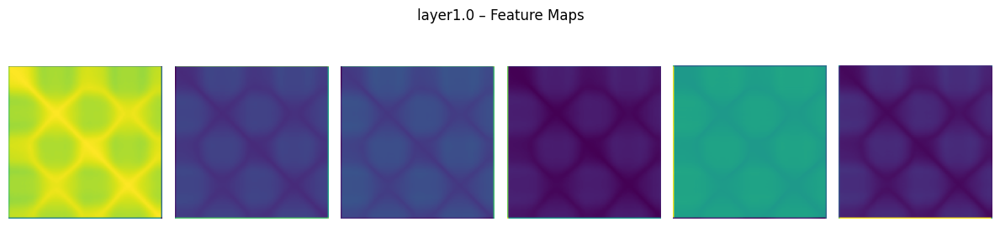

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09626731..0.29788628].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22874777..0.19914575].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3154559..0.18463838].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.33921257..0.13338149].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.26785412..0.21770747].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.31260243..0.16399927].


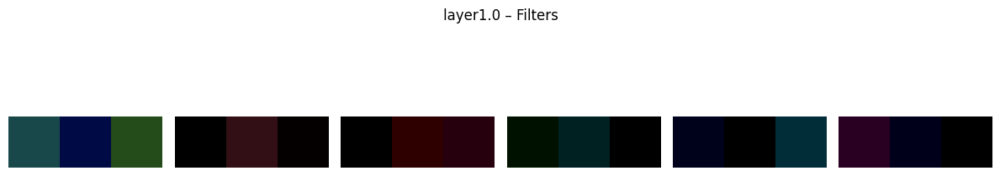

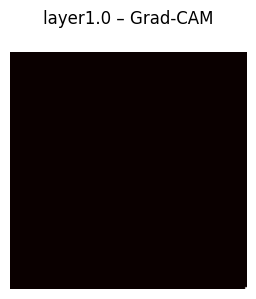

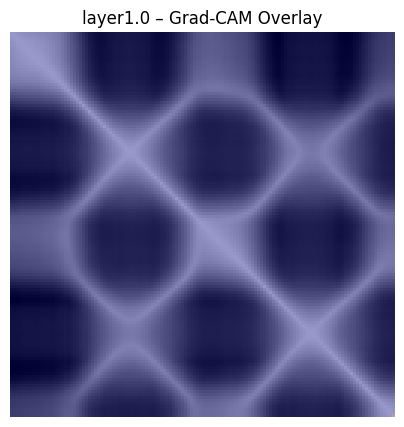

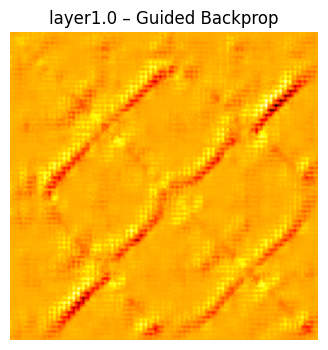

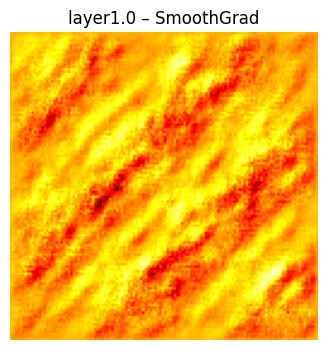

📌 Visualizing layer: layer2.0


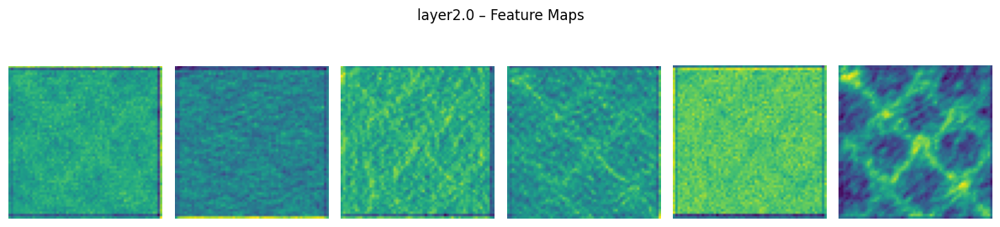

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08192415..0.07376429].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09763222..0.09109704].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09515404..0.09542596].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.114122495..0.12341591].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09153311..0.06835589].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.076501764..0.1511191].


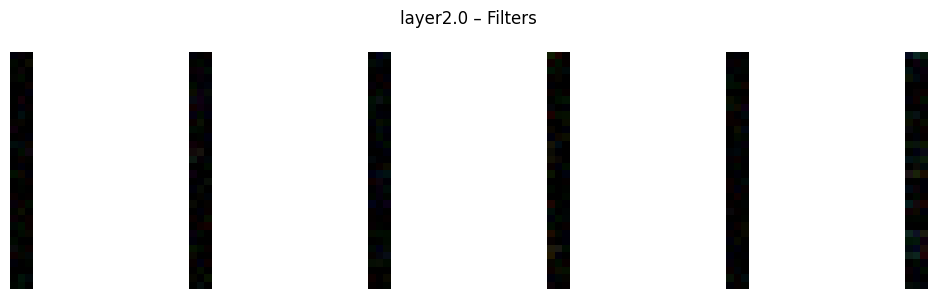

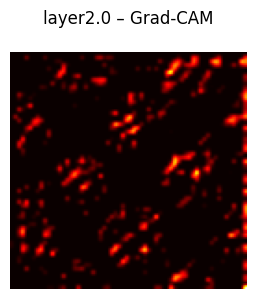

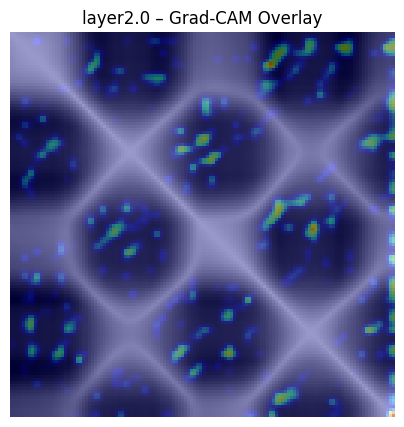

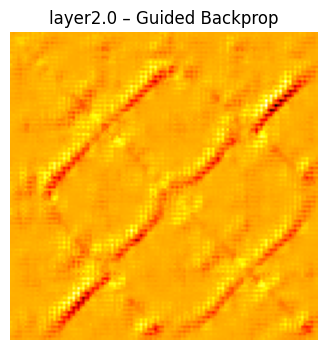

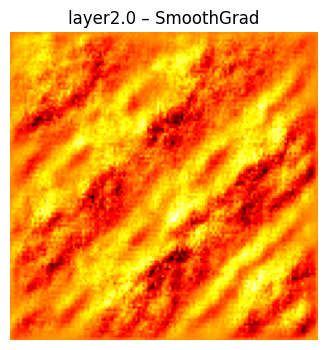

📌 Visualizing layer: layer3.0


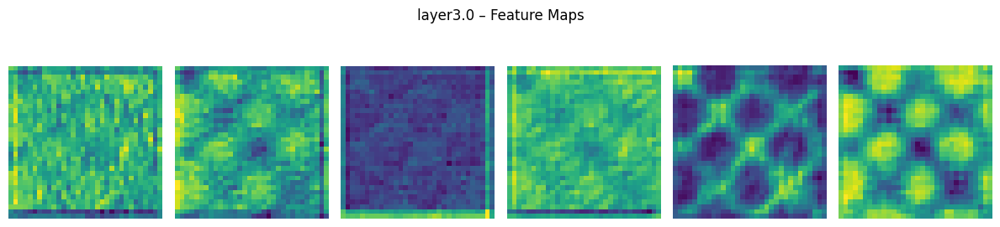

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07356476..0.0600295].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10690122..0.057880443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08120289..0.08247245].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08913707..0.10023308].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07265686..0.10916557].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10527818..0.071176514].


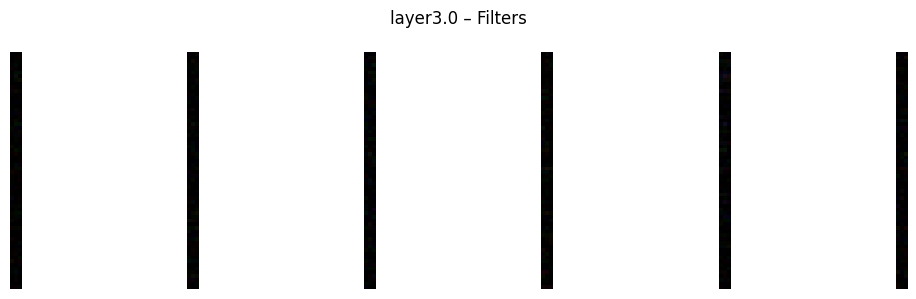

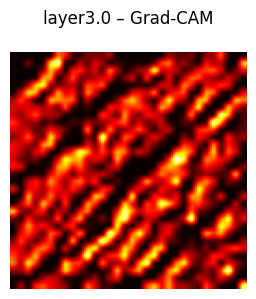

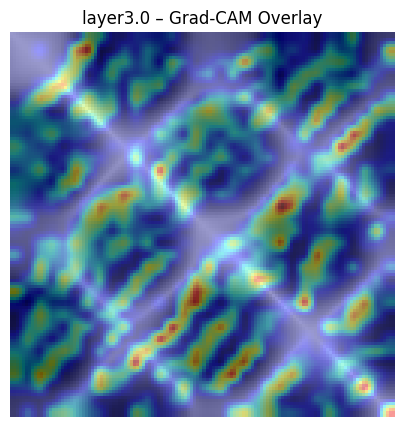

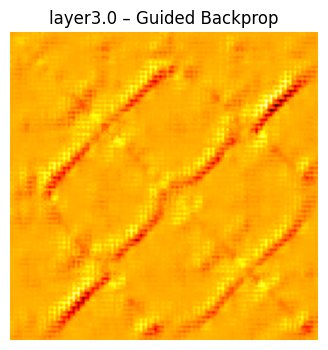

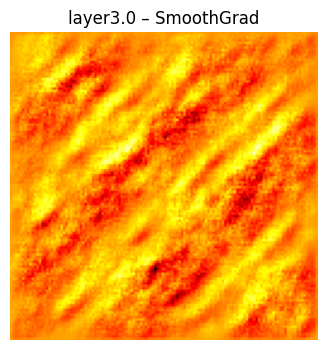

📌 Visualizing layer: layer4.0


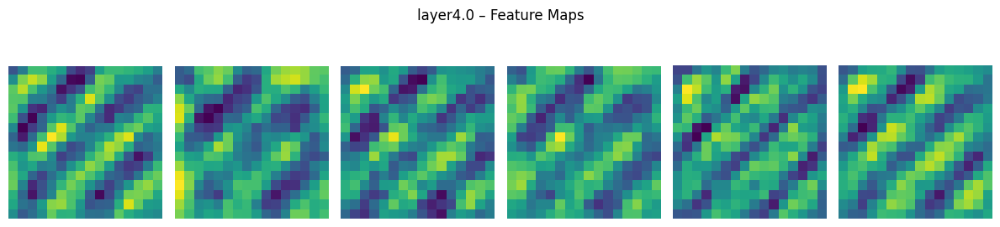

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06917026..0.08036366].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08761984..0.05831887].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14077199..0.11849128].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10305507..0.06669687].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07613698..0.09290763].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07707688..0.05934507].


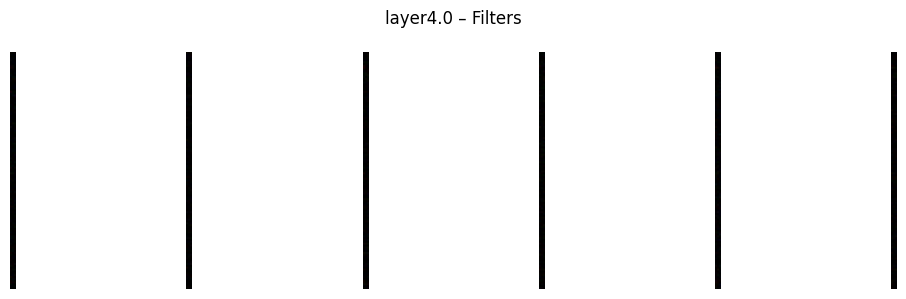

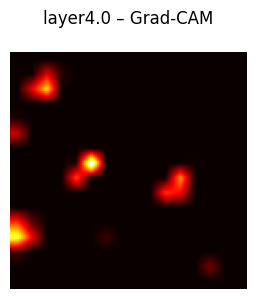

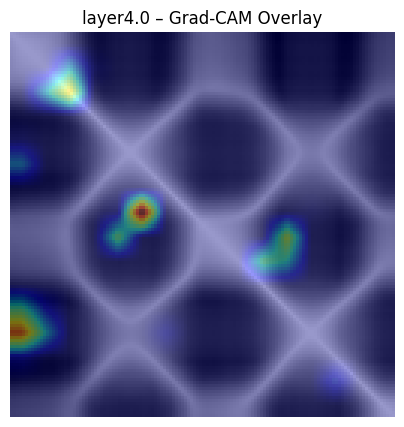

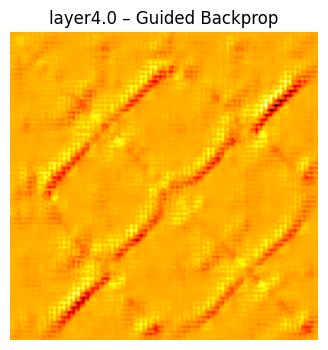

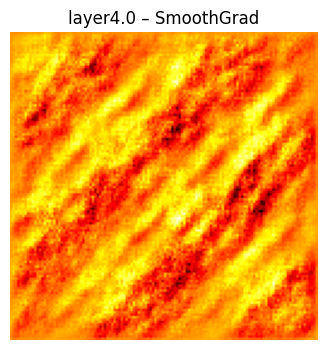

In [18]:
filename = '2_dkjd823kjf'
sim_matrix = generate_video_similarity_matrix(f'video-data/{filename}.mp4', save_and_show=False)
sim_matrix_resized = cv2.resize(sim_matrix, (FIXED_SIZE, FIXED_SIZE))
sim_tensor = torch.tensor(sim_matrix_resized, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

visualize_cnn_features(
    model=model,
    input_tensor=sim_tensor,
    device=DEVICE,
    save_dir=f"cnn_feature_outputs_{filename}"
)

In [20]:
torch.save(model.state_dict(), "TSM_CNN2D_EMDLoss.pt")

### Calculate latency and num of parameters

In [23]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params}")

Total parameters: 391370


In [24]:
def _synchronize_device(device):
    try:
        if device.type == "cuda":
            torch.cuda.synchronize()
        elif device.type == "mps":
            if hasattr(torch, "mps") and hasattr(torch.mps, "synchronize"):
                try:
                    torch.mps.synchronize()
                except Exception:
                    pass
    except Exception:
        pass

def measure_latency(
    video_paths,
    model,
    device,
    repeat=2,
    warmup=3,
    matrix_size=(128,128),
    verbose=True
):
    """
    Measures latency (seconds) for each video and returns summary stats including FPS.
    Reports: preprocess (video->sim matrix), tensor conversion, model forward, total,
    plus:
      - preprocess_fps = n_frames / preprocess_mean
      - model_videos_per_sec = 1 / forward_mean  (how many videos/sec the model can classify)
      - total_fps = n_frames / total_mean
    """
    
    model = model.to(device)
    model.eval()
    per_video_stats = {}

    for path in video_paths:
        runs = {"pre": [], "to_tensor": [], "forward": [], "total": []}
        n_frames = None

        # Warmup + timed runs
        for i in range(warmup + repeat):
            t0 = time.perf_counter()

            # 1) Preprocessing: build similarity matrix
            t_pre_start = time.perf_counter()
            cap = cv2.VideoCapture(path)
            frames_flat = []
            calc_dim = (64, 64)

            while True:
                ret, frame = cap.read()
                if not ret:
                    break
                gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                resized = cv2.resize(gray, calc_dim)
                frames_flat.append(resized.flatten())

            cap.release()

            if n_frames is None:
                n_frames = len(frames_flat)

            if len(frames_flat) == 0:
                sim_matrix = np.zeros(matrix_size, dtype=np.float32)
            else:
                video_matrix = np.array(frames_flat, dtype=np.float32) / 255.0
                video_matrix += 1e-6
                sim_matrix = cosine_similarity(video_matrix)
                sim_matrix = cv2.resize(sim_matrix, (matrix_size[1], matrix_size[0]))
                sim_matrix = np.clip(sim_matrix, -1.0, 1.0).astype(np.float32)
            t_pre_end = time.perf_counter()

            # 2) Convert to tensor and move to device
            t_tensor_start = time.perf_counter()
            input_tensor = torch.tensor(sim_matrix, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
            input_tensor = input_tensor.to(device)
            t_tensor_end = time.perf_counter()

            # 3) Forward (inference)
            _synchronize_device(device)
            t_for_start = time.perf_counter()
            with torch.no_grad():
                _ = model(input_tensor)
            _synchronize_device(device)
            t_for_end = time.perf_counter()

            t1 = time.perf_counter()

            if i >= warmup:
                runs["pre"].append(t_pre_end - t_pre_start)
                runs["to_tensor"].append(t_tensor_end - t_tensor_start)
                runs["forward"].append(t_for_end - t_for_start)
                runs["total"].append(t1 - t0)

        # summarize
        def summarize(arr):
            return {
                "mean": statistics.mean(arr),
                "median": statistics.median(arr),
                "std": statistics.pstdev(arr),
                "p95": sorted(arr)[int(0.95 * len(arr))],
                "n": len(arr)
            }

        pre_stats = summarize(runs["pre"])
        to_tensor_stats = summarize(runs["to_tensor"])
        forward_stats = summarize(runs["forward"])
        total_stats = summarize(runs["total"])

        # Calculate FPS metrics (guard against zero)
        if n_frames is None:
            n_frames = 0
        preprocess_fps = None
        total_fps = None
        model_videos_per_sec = None

        if pre_stats["mean"] > 0 and n_frames > 0:
            preprocess_fps = n_frames / pre_stats["mean"]
        if total_stats["mean"] > 0 and n_frames > 0:
            total_fps = n_frames / total_stats["mean"]
        if forward_stats["mean"] > 0:
            model_videos_per_sec = 1.0 / forward_stats["mean"]

        per_video_stats[path] = {
            "n_frames": n_frames,
            "preprocess": pre_stats,
            "to_tensor": to_tensor_stats,
            "forward": forward_stats,
            "total": total_stats,
            "fps": {
                "preprocess_fps": preprocess_fps,
                "model_videos_per_sec": model_videos_per_sec,
                "total_fps": total_fps
            }
        }

        if verbose:
            print(f"\nVideo: {path}")
            print(f"  Frames: {n_frames}")
            print(f"  Preprocess mean: {pre_stats['mean']:.4f}s", end='')
            if preprocess_fps:
                print(f"  ({preprocess_fps:.2f} frames/s)")
            else:
                print()
            print(f"  To-tensor mean:  {to_tensor_stats['mean']:.4f}s")
            print(f"  Forward mean:    {forward_stats['mean']:.4f}s", end='')
            if model_videos_per_sec:
                print(f"  ({model_videos_per_sec:.2f} videos/s)")
            else:
                print()
            print(f"  Total mean:      {total_stats['mean']:.4f}s", end='')
            if total_fps:
                print(f"  ({total_fps:.2f} frames/s end-to-end)")
            else:
                print()

    return per_video_stats

In [25]:
def aggregate_latency_stats(per_video_stats):
    """
    Combine per-video stats into overall metrics.
    FPS that depend on frames use total_frames / sum(per-video mean_times).
    Model throughput (videos/sec) is computed as total_videos / sum(per-video forward_mean).
    Returns a dict with combined numbers and prints a short summary.
    """

    total_videos = 0
    total_frames = 0
    sum_pre_mean = 0.0
    sum_to_tensor_mean = 0.0
    sum_forward_mean = 0.0
    sum_total_mean = 0.0

    # Also collect lists if you want pooled statistics
    pre_means = []
    to_tensor_means = []
    forward_means = []
    total_means = []

    for path, s in per_video_stats.items():
        n = s.get("n_frames", 0)
        # some videos may be empty or missing stats; skip those for frame-based FPS
        pre = s.get("preprocess", {}).get("mean")
        to_t = s.get("to_tensor", {}).get("mean")
        fwd = s.get("forward", {}).get("mean")
        tot = s.get("total", {}).get("mean")

        # Count video if we have valid forward/total numbers
        if tot is None or fwd is None:
            continue

        total_videos += 1
        if n and n > 0:
            total_frames += n
            if pre is not None:
                sum_pre_mean += pre
        if to_t is not None:
            sum_to_tensor_mean += to_t
        if fwd is not None:
            sum_forward_mean += fwd
        if tot is not None:
            sum_total_mean += tot

        if pre is not None:
            pre_means.append(pre)
        if to_t is not None:
            to_tensor_means.append(to_t)
        if fwd is not None:
            forward_means.append(fwd)
        if tot is not None:
            total_means.append(tot)

    combined = {}
    # Guard against zero
    if total_frames > 0 and sum_pre_mean > 0:
        combined["combined_preprocess_fps"] = total_frames / sum_pre_mean
    else:
        combined["combined_preprocess_fps"] = None

    if total_videos > 0 and sum_forward_mean > 0:
        # how many videos/sec the model can classify across this set
        combined["combined_model_videos_per_sec"] = total_videos / sum_forward_mean
    else:
        combined["combined_model_videos_per_sec"] = None

    if total_frames > 0 and sum_total_mean > 0:
        combined["combined_total_fps"] = total_frames / sum_total_mean
    else:
        combined["combined_total_fps"] = None

    # also provide simple averages of timings (per-video mean)
    def mean_or_none(lst):
        return (sum(lst) / len(lst)) if len(lst) else None

    combined.update({
        "total_videos_counted": total_videos,
        "total_frames": total_frames,
        "avg_preprocess_mean": mean_or_none(pre_means),
        "avg_to_tensor_mean": mean_or_none(to_tensor_means),
        "avg_forward_mean": mean_or_none(forward_means),
        "avg_total_mean": mean_or_none(total_means),
    })

    # print summary
    print("\n--- Combined Latency Summary ---")
    print(f"Videos counted: {combined['total_videos_counted']}")
    print(f"Total frames (sum): {combined['total_frames']}")
    if combined["combined_preprocess_fps"]:
        print(f"Combined preprocess FPS (total_frames / sum(pre_mean)): {combined['combined_preprocess_fps']:.2f} fps")
    else:
        print("Combined preprocess FPS: N/A")
    if combined["combined_model_videos_per_sec"]:
        print(f"Combined model throughput (videos/sec): {combined['combined_model_videos_per_sec']:.2f} videos/s")
    else:
        print("Combined model throughput: N/A")
    if combined["combined_total_fps"]:
        print(f"Combined end-to-end FPS (total_frames / sum(total_mean)): {combined['combined_total_fps']:.2f} fps")
    else:
        print("Combined end-to-end FPS: N/A")
    print("--------------------------------\n")

    return combined

In [ ]:
videos = [f for f in os.listdir(VIDEOS_DIR_PATH) if f.endswith(VIDEO_EXTENSIONS)]
videos_full_paths = [os.path.join(VIDEOS_DIR_PATH, f) for f in videos]
stats = measure_latency(videos_full_paths, model, DEVICE, repeat=20, warmup=5)
combined = aggregate_latency_stats(stats)

print(combined)


Video: ./video-data/2_sadfasjldkfjaseifj.mp4
  Frames: 159
  Preprocess mean: 0.2734s  (581.58 frames/s)
  To-tensor mean:  0.0008s
  Forward mean:    0.0026s  (381.90 videos/s)
  Total mean:      0.2768s  (574.37 frames/s end-to-end)

Video: ./video-data/2_sdafkjaslkclaksdjkas.mp4
  Frames: 84
  Preprocess mean: 0.1787s  (470.06 frames/s)
  To-tensor mean:  0.0008s
  Forward mean:    0.0024s  (408.34 videos/s)
  Total mean:      0.1819s  (461.68 frames/s end-to-end)

Video: ./video-data/4_kling_20251206_Text_to_Video_Generate_a_28_0.mp4
  Frames: 241
  Preprocess mean: 0.3020s  (798.11 frames/s)
  To-tensor mean:  0.0014s
  Forward mean:    0.0048s  (207.10 videos/s)
  Total mean:      0.3083s  (781.82 frames/s end-to-end)

Video: ./video-data/3_kling_dskfseu.mp4
  Frames: 228
  Preprocess mean: 0.3284s  (694.25 frames/s)
  To-tensor mean:  0.0008s
  Forward mean:    0.0023s  (437.98 videos/s)
  Total mean:      0.3315s  (687.83 frames/s end-to-end)


In [ ]:
# !hf auth login

User is already logged in.


In [ ]:
# # YOUR HUGGING FACE USERNAME BELOW
# hf_username = 'MannSingh'

# from huggingface_hub import HfApi

# def save_model(model, path="model.pt"):
#     """Save the model weights to a file."""
#     torch.save(model.state_dict(), path)
#     print(f"Model saved to {path}")


# def upload_to_hub(local_path="model.pt", repo_id=f"{hf_username}/mv-final-assignment"):
#     """
#     Upload model to Hugging Face Hub.

#     Args:
#         local_path: Path to your saved model file
#         repo_id: Your repo in format "username/model-name"
#     """
#     api = HfApi()

#     # Create the repo first (if it already exists, this will just skip)
#     api.create_repo(
#         repo_id=repo_id,
#         repo_type="model",
#         exist_ok=True,  # Don't error if it already exists
#         private=False,  # Make it public so TAs can access
#     )

#     # Now upload the file
#     api.upload_file(
#         path_or_fileobj=local_path,
#         path_in_repo="model.pt",
#         repo_id=repo_id,
#         repo_type="model",
#     )

#     print(f"Model uploaded to https://huggingface.co/{repo_id}")


# save_model(model, "mv-final-assignment.pt")
# upload_to_hub("mv-final-assignment.pt", f"{hf_username}/mv-final-assignment")

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Model saved to mv-final-assignment.pt


Processing Files (1 / 1): 100%|██████████| 1.58MB / 1.58MB, 1.32MB/s  
New Data Upload: 100%|██████████| 1.58MB / 1.58MB, 1.32MB/s  


Model uploaded to https://huggingface.co/MannSingh/mv-final-assignment
